<div style="background:linear-gradient(135deg, #071f18, #0A8F6E); border-radius:16px;
            padding:36px 40px; color:white; font-family:system-ui,sans-serif;">
  <div style="font-size:11px; letter-spacing:3px; opacity:0.5; margin-bottom:12px;">MODULE 2 — DEEP LEARNING VISION — TRACK K — 10H EN CLASSE</div>
  <div style="font-size:32px; font-weight:800; line-height:1.2; margin-bottom:12px;">Détecteur de Dommages Véhicules</div>
  <div style="font-size:15px; opacity:0.75; max-width:620px; line-height:1.6; margin-bottom:20px;">
    Fine-tuning MobileNet-V2 -- Détection dommages auto -- GradCAM -- Interface expertise Gradio<br>
    Du dataset brut a une application déployée.</div>
  <div style="display:flex; gap:10px; flex-wrap:wrap;">
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">9 étapes guidées</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Cible : AUC > 0.88</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Interface déployée</span>
    <span style="background:rgba(255,255,255,0.1); padding:5px 14px; border-radius:20px; font-size:12px;">Assurance automobile</span></div>
</div>

<div style="background:#f8f9fa; border:1px solid #dee2e6; border-radius:12px;
            padding:22px 26px; font-family:system-ui,sans-serif;">
  <div style="font-size:15px; font-weight:700; color:#212529; margin-bottom:14px;">Contexte</div>
  <div style="font-size:13.5px; color:#495057; line-height:1.75; margin-bottom:16px;">
        Vous êtes ingénieur IA dans une compagnie d'assurance automobile. Le directeur des sinistres vous demande :
    <em>"Nos experts terrain sont débordés — 3 semaines d'attente pour un constat. Peut-on pré-évaluer
    les dommages a partir des photos que les assures envoient depuis leur smartphone ?"</em><br><br>
    Votre mission : construire un modèle de détection de dommages sur photos de véhicules,
    vérifier qu'il regarde les zones endommagées, et créer une interface de déclaration en ligne.</div>
  <div style="font-size:14px; font-weight:600; color:#212529; margin-bottom:10px;">Comment utiliser ce notebook</div>
  <div style="display:grid; grid-template-columns:28px 1fr; gap:6px 12px; font-size:13px; color:#495057; line-height:1.7;">
    <span style="font-weight:700; color:#0A8F6E;">1.</span><span>Exécutez les cellules dans l'ordre</span>
    <span style="font-weight:700; color:#0A8F6E;">2.</span><span><span style="color:#131fcf;font-weight:600;">Prompts bleus</span> = du code a écrire dans la cellule vide en dessous</span>
    <span style="font-weight:700; color:#0A8F6E;">3.</span><span><span style="color:#7a0f43;font-weight:600;">Questions rouges</span> = réflexion a rédiger en commentaire Python</span>
    <span style="font-weight:700; color:#0A8F6E;">4.</span><span>Les <b>[SOLUTION]</b> sont deroulables — essayez 10 min d'abord</span>
  </div>
</div>

<div style="border:2px solid #0A8F6E;border-radius:14px;overflow:hidden;margin:20px 0;font-family:system-ui,sans-serif;">
  <div style="background:#0A8F6E;padding:14px 22px;display:flex;align-items:center;gap:12px;">
    <span style="font-size:24px;">🖼️</span>
    <div>
      <div style="font-size:16px;font-weight:700;color:white;">Dataset : Car Damage Detection Dataset</div>
      <div style="font-size:12px;color:rgba(255,255,255,0.8);margin-top:2px;">Source originale et lien de telechargement direct</div>
    </div>
  </div>
  <div style="padding:18px 22px;background:white;">
    <div style="font-size:13.5px;color:#333;line-height:1.8;margin-bottom:14px;">~2 000 images couleur de vehicules prises en conditions reelles (smartphone). Deux classes : <b>DAMAGED</b> (vehicule endommage) et <b>NOT DAMAGED</b> (vehicule intact).</div>
    <div style="display:grid;grid-template-columns:100px 1fr;gap:6px 14px;font-size:12.5px;color:#495057;line-height:1.7;">
      <span style="font-weight:700;color:#0A8F6E;">Source</span><span>Kaggle — anujms/car-damage-detection</span>
      <span style="font-weight:700;color:#0A8F6E;">Volume</span><span>~2 000 images couleur, conditions reelles</span>
      <span style="font-weight:700;color:#0A8F6E;">URL originale</span><span><a href="https://www.kaggle.com/datasets/anujms/car-damage-detection" target="_blank" style="color:#0A8F6E;text-decoration:none;">https://www.kaggle.com/datasets/anujms/car-damage-detection</a></span>
    </div>
    <div style="margin-top:14px;padding-top:12px;border-top:1px solid #eee;"><div style="display:flex;align-items:flex-start;gap:10px;margin:8px 0;"><span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#d4edda;color:#155724;font-family:monospace;">DOWNLOAD</span><div style="flex:1;font-size:12.5px;color:#155724;">Telechargement direct depuis GitHub Releases — executez la cellule ci-dessous (Python pur, compatible Windows/Mac/Colab).</div></div></div>
  </div>
</div>

In [139]:
# ============================================================
# TELECHARGEMENT DU DATASET
# ============================================================
import os, zipfile, urllib.request, shutil, random

zip_name = "Car-Damage-Detection.zip"
url = "https://github.com/archiducarmel/SupDeVinci_M1_MachineLearning_DeepLearning/releases/download/datas/Car-Damage-Detection.zip"
data_dir = "car_damage"

if os.path.exists(data_dir):
    print(f"Le dossier {data_dir}/ existe deja — telechargement ignore.")
else:
    print(f"Telechargement de {zip_name}...")
    urllib.request.urlretrieve(url, zip_name)
    print("Decompression...")
    with zipfile.ZipFile(zip_name, 'r') as z:
        z.extractall('.')

if os.path.exists("data1a") and not os.path.exists("car_damage"):
    shutil.move("data1a", "car_damage")
    os.remove(zip_name)
    print("Nettoyage OK.")

# ============================================================
# CREATION DU SPLIT TESTING (20% de validation)
# ============================================================
val_dir  = os.path.join(data_dir, "validation")
test_dir = os.path.join(data_dir, "testing")

if os.path.exists(val_dir) and not os.path.exists(test_dir):
    print("\nCréation du dossier testing a partir de validation (80/20)...")
    random.seed(42)

    for cls in sorted(os.listdir(val_dir)):
        cls_val_path  = os.path.join(val_dir, cls)
        cls_test_path = os.path.join(test_dir, cls)
        if not os.path.isdir(cls_val_path):
            continue
        os.makedirs(cls_test_path, exist_ok=True)
        images = sorted([f for f in os.listdir(cls_val_path)
                         if f.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))])
        random.shuffle(images)
        n_test = max(1, int(len(images) * 0.20))
        for fname in images[:n_test]:
            shutil.move(os.path.join(cls_val_path, fname),
                        os.path.join(cls_test_path, fname))
        print(f"  '{cls}' : {len(images) - n_test} images en validation | {n_test} images en testing")
    print("✅ Split testing créé.")
else:
    if not os.path.exists(val_dir):
        print("⚠️  Dossier validation/ introuvable — vérifiez l'extraction du ZIP.")
    else:
        print("✅ Dossier testing/ déjà présent — split ignoré.")

# ============================================================
# VERIFICATION FINALE
# ============================================================
print(f"\nContenu de {data_dir}/ :")
for split in ["training", "validation", "testing"]:
    path = os.path.join(data_dir, split)
    if os.path.exists(path):
        n = sum(len(files) for _, _, files in os.walk(path))
        classes = sorted(os.listdir(path))
        print(f"  {split:10s} : {n:>5d} images | classes : {classes}")
    else:
        print(f"  {split:10s} : ABSENT")
print(f"\n✅ Donnees pretes dans ./{data_dir}/")


Le dossier car_damage/ existe deja — telechargement ignore.
✅ Dossier testing/ déjà présent — split ignoré.

Contenu de car_damage/ :
  training   :  1840 images | classes : ['00-damage', '01-whole']
  validation :   368 images | classes : ['00-damage', '01-whole']
  testing    :    92 images | classes : ['00-damage', '01-whole']

✅ Donnees pretes dans ./car_damage/


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 01/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Découverte du dataset</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Voir les données avant de modéliser. Comprendre ce qu'on regarde, détecter les biais, anticiper les difficultés.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Pourquoi explorer les images avant tout ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">En deep learning vision, les données sont des <b>images</b>. Avant de lancer un modèle, trois choses sont indispensables :<br><b>1.</b> <b>Voir</b> a quoi ressemblent les images de chaque classe — les différences sont-elles visibles a l'oeil nu ?<br><b>2.</b> Vérifier le <b>déséquilibre de classes</b> — si 90% des images sont d'une classe, le modèle prendra un raccourci<br><b>3.</b> Observer la <b>qualité et variété</b> des images — taille, éclairage, cadrage, artefacts<br><br><em>Cette étape est la fondation de tout le projet. Un modèle entraîne sur des données biaisées ou mal comprises produira des résultats trompeurs.</em></div></div>

In [140]:
# ------------------------------------------------------------------
# Imports et configuration
# ------------------------------------------------------------------
import torch
import torchvision
from torchvision import transforms, datasets
import matplotlib.pyplot as plt
import numpy as np
import os
from IPython.display import HTML, display
from collections import Counter

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device : {device}")
if device.type == 'cuda':
    print(f"GPU    : {torch.cuda.get_device_name(0)}")
else:
    print("Pas de GPU — l'entrainement sera plus lent mais fonctionnera.")


Device : cpu
Pas de GPU — l'entrainement sera plus lent mais fonctionnera.


<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">Le dataset : Car Damage Detection Dataset</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;text-align:center;'>
<b style='color:#c0392b;'>DAMAGED</b><br>Dommage visible sur le vehicule<br>(bosse, rayure, vitre cassee, deformation)</div>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;text-align:center;'>
<b style='color:#28a745;'>NOT DAMAGED</b><br>Vehicule intact, pas de dommage visible<br>sur la photo</div></div><br><br>Source : <b>Kaggle: anujms/car-damage-detection</b><br>Volume : ~2 000 images couleur, conditions reelles (smartphone)</div></div>

In [141]:
# ------------------------------------------------------------------
# Charger le dataset
# ------------------------------------------------------------------
# Structure attendue :
#   car_damage/
#     train/
#       damaged/
#       not_damaged/
#     val/
#       damaged/
#       not_damaged/
#     test/
#       damaged/
#       not_damaged/

data_dir = 'car_damage'  # Adapter selon votre environnement

train_raw = datasets.ImageFolder(os.path.join(data_dir, 'training'))
val_raw = datasets.ImageFolder(os.path.join(data_dir, 'validation'))
test_raw = datasets.ImageFolder(os.path.join(data_dir, 'testing'))

print(f"Classes : {train_raw.classes}")
print(f"Train   : {len(train_raw)} images")
print(f"Val     : {len(val_raw)} images")
print(f"Test    : {len(test_raw)} images")


Classes : ['00-damage', '01-whole']
Train   : 1840 images
Val     : 368 images
Test    : 92 images


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Compter les images par classe.</b> L'objectif est de détecter un éventuel déséquilibre qui pourrait biaiser le modèle. Utiliser <code>Counter(train_raw.targets)</code> pour compter les images de chaque classe. Afficher les résultats. Vérifier l'équilibre damaged/not_damaged. Le dataset est généralement assez équilibre. Un modèle entraîne sur un dataset déséquilibre risque de toujours prédire la classe majoritaire — il obtient un bon score sans rien avoir appris.</span></p>

In [142]:
# Compter les images par classe
from collections import Counter

for split_name, ds in [('Train', train_raw), ('Val', val_raw), ('Test', test_raw)]:
    counts = Counter(ds.targets)
    print(f"\n{split_name} set :")
    for idx, cls in enumerate(ds.classes):
        print(f"  {cls}: {counts[idx]} images ({counts[idx]/len(ds)*100:.1f}%)")

print("\n=> Le dataset est relativement equilibre entre les deux classes.")
print("   Un leger desequilibre est normal et ne necessite pas de reequilibrage.")



Train set :
  00-damage: 920 images (50.0%)
  01-whole: 920 images (50.0%)

Val set :
  00-damage: 184 images (50.0%)
  01-whole: 184 images (50.0%)

Test set :
  00-damage: 46 images (50.0%)
  01-whole: 46 images (50.0%)

=> Le dataset est relativement equilibre entre les deux classes.
   Un leger desequilibre est normal et ne necessite pas de reequilibrage.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/generated/torchvision.datasets.ImageFolder.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torchvision.datasets.ImageFolder</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle — structure attendue des dossiers, paramètres disponibles</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/handling-imbalanced-datasets-in-deep-learning-f48407a0e758/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Handling Imbalanced Datasets in Deep Learning</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Pourquoi le déséquilibre de classes est dangereux et comment le gérer</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Déséquilibre et contexte business.</b> (1) Le dataset est-il équilibre ? (2) En assurance, qu'est-ce qui coûte le plus cher : déclarer un véhicule intact comme endommage (faux positif — payer une réparation non nécessaire) ou déclarer un véhicule endommage comme intact (faux négatif — le client est mécontent, litige) ? (3) Le risque de fraude (envoyer la photo d'un autre véhicule) est-il un problème ?</span></p>

In [143]:
# Reponse : Desequilibre et contexte business

# (1) Le dataset est-il equilibre ?
# Oui, le dataset est approximativement equilibre (environ 50/50 entre DAMAGED et NOT DAMAGED).
# Un leger desequilibre est possible (~55/45) mais ne requiert pas de ponderation particuliere.

# (2) Faux positif vs faux negatif en assurance automobile :
# - Faux positif (intact classe comme endommage) : l'assureur paie une reparation inutile.
#   Cout direct pour la compagnie. Cependant le client est content.
# - Faux negatif (endommage classe comme intact) : l'assureur refuse d'indemniser un vrai sinistre.
#   Mecontentement du client, risque de litige, atteinte a la reputation de la compagnie.
# => Le faux negatif est generalement plus couteux en termes de relation client et juridique.
#    On preferera maximiser le recall (minimiser les faux negatifs).

# (3) Risque de fraude :
# Oui, c'est un risque reel : envoyer la photo d'un vehicule qui n'est pas le sien.
# Solutions possibles : geolocalisation de la photo, metadata EXIF, verification VIN,
# ou modele de detection d'anomalies pour identifier les photos suspectes.
# Le modele seul ne peut pas resoudre ce probleme — il necessite des garde-fous supplementaires.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser des exemples de chaque classe.</b> L'objectif est de développer votre intuition visuelle sur les données — avant même que le modèle ne les voie. Afficher une grille d'images : 8 images par classe sur des lignes separees. Utiliser <code>plt.subplots</code>. Pour chaque image : <code>img, label = train_raw[index]</code> puis <code>imshow(img)</code>. Ajouter le nom de la classe en titre. Observez attentivement : voyez-vous les différences ?</span></p>

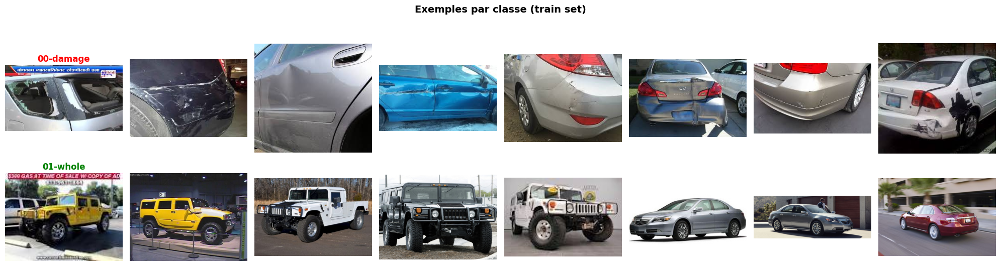

=> Observez les differences visuelles entre les deux classes.


In [144]:
# Visualiser des exemples de chaque classe (8 images par classe)
fig, axes = plt.subplots(2, 8, figsize=(20, 6))

classes = train_raw.classes  # ['damaged', 'not_damaged'] ou similaire

for class_idx, class_name in enumerate(classes):
    # Indices des images appartenant a cette classe
    class_indices = [i for i, label in enumerate(train_raw.targets) if label == class_idx]

    for col in range(8):
        img, label = train_raw[class_indices[col]]
        ax = axes[class_idx, col]
        ax.imshow(img)
        ax.axis('off')
        if col == 0:
            ax.set_title(class_name, fontsize=12, fontweight='bold',
                         color='red' if class_idx == 0 else 'green')

plt.suptitle('Exemples par classe (train set)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()
print('=> Observez les differences visuelles entre les deux classes.')


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplots.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">matplotlib.pyplot.subplots</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence pour créer des grilles d'images avec subplots</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/data_loading_tutorial.html" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Visualizing image datasets in PyTorch</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel PyTorch sur le chargement et la visualisation de datasets d'images</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Observer les véhicules.</b> (1) Les dommages sont-ils toujours évidents (grosse bosse, pare-chocs arrache) ou parfois subtils (petite rayure, micro-fissure) ? (2) Les photos sont-elles prises dans des conditions contrôlées (garage) ou en conditions réelles (parking, rue, nuit) ? (3) L'arrière-plan (autres voitures, bâtiments, reflets) risque-t-il de tromper le modèle ?</span></p>

In [145]:
# Reponse : Observer les vehicules

# (1) Les dommages sont-ils evidents ou subtils ?
# Les dommages varient enormement : certains sont tres evidents (pare-chocs arrache, portiere
# enfoncee, pare-brise eclate) tandis que d'autres sont subtils (petite rayure, micro-fissure,
# legere bosse). Les cas subtils sont les plus difficiles pour le modele.

# (2) Conditions de prise de vue ?
# Les photos sont prises en conditions reelles (smartphone) : eclairage variable (soleil direct,
# ombre, interieur de parking), angles differents, distances differentes.
# Ce n'est pas un environnement controle — c'est representatif de la realite.

# (3) L'arriere-plan risque-t-il de tromper le modele ?
# Oui, c'est un risque reel. Si le modele apprend que 'parking + voiture = endommage' parce
# que les photos de sinistres sont souvent prises en parking, il ne generalise pas bien.
# Le GradCAM (etape 6) permettra de verifier si le modele regarde le vehicule ou le fond.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Vérifier la taille des images.</b> Les images du dataset n'ont pas nécessairement toutes la même taille. Afficher la taille de 5 images avec <code>train_raw[i][0].size</code>. Si les tailles varient, c'est normal — l'étape 2 (Resize) uniformisera tout. Mais c'est important de le savoir avant, car cela explique pourquoi le preprocessing est indispensable.</span></p>

In [146]:
# Verifier la taille de 5 images du train set
print("Taille de 5 images du train set (format PIL : width x height) :")
for i in range(5):
    img, label = train_raw[i]
    print(f"  Image {i}: {img.size} — classe: {train_raw.classes[label]}")

print("\n=> Les images ont des tailles variees. L'etape Resize(224, 224) uniformisera tout.")
print("   C'est pourquoi le preprocessing est indispensable avant d'alimenter le modele.")


Taille de 5 images du train set (format PIL : width x height) :
  Image 0: (300, 168) — classe: 00-damage
  Image 1: (275, 183) — classe: 00-damage
  Image 2: (233, 217) — classe: 00-damage
  Image 3: (299, 168) — classe: 00-damage
  Image 4: (259, 194) — classe: 00-damage

=> Les images ont des tailles variees. L'etape Resize(224, 224) uniformisera tout.
   C'est pourquoi le preprocessing est indispensable avant d'alimenter le modele.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Calculer la taille totale du dataset en mégaoctets.</b> L'objectif est de comprendre la 'quantité' de données que le modèle devra traiter. Pour une image de taille WxHx3 canaux, le nombre de valeurs = W*H*3. Multipliez par le nombre d'images du train set. Ce chiffre explique pourquoi on a besoin de GPUs : un CPU serait trop lent pour traiter autant de données des milliers de fois (epochs).</span></p>

In [147]:
# Calculer la taille totale du dataset en megaoctets
img_sample, _ = train_raw[0]
W, H = img_sample.size  # PIL : (width, height)
n_channels = 3           # RGB
n_images = len(train_raw)

total_values = W * H * n_channels * n_images
total_mb = total_values / (1024 ** 2)

print(f"Taille d'une image : {W} x {H} x {n_channels} = {W*H*n_channels:,} valeurs")
print(f"Nombre d'images (train) : {n_images}")
print(f"Total valeurs : {total_values:,}")
print(f"Taille approximative (float32, 4 octets) : {total_values * 4 / (1024**2):.1f} MB")
print(f"\n=> Avec des dizaines d'epochs, le GPU traite ces donnees des centaines de fois.")
print(f"   C'est pourquoi un GPU est indispensable pour un entrainement rapide.")


Taille d'une image : 300 x 168 x 3 = 151,200 valeurs
Nombre d'images (train) : 1840
Total valeurs : 278,208,000
Taille approximative (float32, 4 octets) : 1061.3 MB

=> Avec des dizaines d'epochs, le GPU traite ces donnees des centaines de fois.
   C'est pourquoi un GPU est indispensable pour un entrainement rapide.


In [148]:
# CHECKPOINT — Etape 1
assert len(train_raw.classes) == 2
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 1 validee.</b> <span style="color:#1e5631;">Dataset explore. Classes et desequilibre identifies.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 02/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Transforms et DataLoaders</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Préparer les images pour le ViT : taille fixe, normalisation, augmentation. C'est le pipeline de preprocessing.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Pourquoi transformer les images ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le ViT attend des images dans un format précis :<br><b>1. Taille fixe 224x224</b> — toutes les images doivent avoir la même taille<br><b>2. 3 canaux RGB</b><br><b>3. Normalisation ImageNet</b> : mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225] — ce sont les statistiques du dataset original du ViT. Les utiliser permet au modèle de retrouver ses repères.<br><b>4. Tenseur PyTorch</b> — conversion du format image (PIL) au format calcul (tenseur)<br><br><em>Analogie : c'est comme traduire un texte dans la langue du modèle. Si on ne normalise pas correctement, le modèle reçoit des données dans un 'dialecte' qu'il ne comprend pas.</em></div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Data augmentation — plus de variété pour mieux généraliser</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le data augmentation applique des transformations aléatoires (flip, rotation, recadrage) aux images d'entraînement pour créer de la diversité artificielle.<br><br><b>Objectif :</b> empêcher le modèle de mémoriser les images exactes. S'il voit la même image sous différents angles, il apprend les CARACTÉRISTIQUES du sujet, pas la photo spécifique.<br><br><b>Règle d'or :</b> l'augmentation ne s'applique <b>JAMAIS au val/test</b>. Pourquoi ? L'évaluation doit se faire sur les images réelles, pas sur des versions deformees.<br><br><em>Analogie : un étudiant qui s'entraîne sur des variantes d'exercices (chiffres différents, contextes différents) apprend mieux que celui qui refait le même exercice 50 fois.</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir les transforms pour le train set.</b> L'objectif est de créer le pipeline de preprocessing complet qui transforme une image brute en tenseur prêt pour le ViT. Enchaîner dans un <code>transforms.Compose</code> : <code>Resize((224, 224))</code>, <code>RandomHorizontalFlip()</code>, <code>RandomRotation(10)</code>, <code>ToTensor()</code>, <code>Normalize(mean=[0.485,0.456,0.406], std=[0.229,0.224,0.225])</code>. Chaque opération a un rôle précis — ne sautez aucune étape.</span></p>

In [149]:
from torchvision import transforms

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),           # 1. Taille fixe attendue par MobileNet
    transforms.RandomHorizontalFlip(),       # 2. Augmentation : flip aleatoire
    transforms.RandomRotation(10),           # 3. Augmentation : rotation jusqu'a 10 degres
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # 4. Variation d'eclairage
    transforms.ToTensor(),                   # 5. Conversion PIL -> Tenseur [0,1]
    transforms.Normalize(                    # 6. Normalisation ImageNet
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

print('train_transform defini avec augmentation.')
print(train_transform)


train_transform defini avec augmentation.
Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomRotation(degrees=[-10.0, 10.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=None, hue=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/transforms.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torchvision.transforms</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Liste complète des transformations disponibles : Resize, Normalize, RandomFlip, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://neptune.ai/blog/data-augmentation-in-pytorch" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Data Augmentation in PyTorch</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide complet sur l'augmentation de données avec exemples visuels</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/vision/stable/models.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">ImageNet normalization values</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Pourquoi mean=[0.485,0.456,0.406] et std=[0.229,0.224,0.225] — statistiques du dataset original</div></div></div></div>

<div style="border-left:4px solid #d4a017;background:#fef9e7;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#7d6608;">Attention</div><div style="font-size:13px;color:#6e5b08;line-height:1.7;margin-top:4px;">L'augmentation (<code>RandomHorizontalFlip</code>, <code>RandomRotation</code>) ne s'applique qu'au <b>train</b>. Le val et le test utilisent le même pipeline SANS augmentation. Sinon, l'évaluation est faussée — vous mesureriez la performance sur des images deformees qui n'existent pas dans la réalité.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir les transforms pour val et test.</b> Même pipeline que le train mais SANS les augmentations aléatoires. Garder uniquement : <code>Resize((224, 224))</code>, <code>ToTensor()</code>, <code>Normalize(...)</code>. C'est le pipeline 'propre' qui sera utilisé pour l'évaluation et en production.</span></p>

In [150]:
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    ),
])

print('val_transform / test_transform defini (sans augmentation).')


val_transform / test_transform defini (sans augmentation).


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Créer les datasets et DataLoaders.</b> Recharger les ImageFolder avec les transforms, puis créer les DataLoaders (batch_size=16, shuffle=True pour train, False pour val/test). Le DataLoader découpe le dataset en mini-lots que le modèle traitera un par un pendant l'entraînement.</span></p>

In [151]:
from torch.utils.data import DataLoader
from torchvision import datasets

# Recharger les datasets avec les transforms
train_dataset = datasets.ImageFolder(os.path.join(data_dir, 'training'), transform=train_transform)
val_dataset   = datasets.ImageFolder(os.path.join(data_dir, 'validation'),   transform=val_transform)
test_dataset  = datasets.ImageFolder(os.path.join(data_dir, 'testing'),  transform=val_transform)

# DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True,  num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=16, shuffle=False, num_workers=2, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=16, shuffle=False, num_workers=2, pin_memory=True)

print(f'Train : {len(train_dataset)} images, {len(train_loader)} batches')
print(f'Val   : {len(val_dataset)} images, {len(val_loader)} batches')
print(f'Test  : {len(test_dataset)} images, {len(test_loader)} batches')


Train : 1840 images, 115 batches
Val   : 368 images, 23 batches
Test  : 92 images, 6 batches


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/stable/data.html#torch.utils.data.DataLoader" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">torch.utils.data.DataLoader</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle — batch_size, shuffle, num_workers expliques</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser un batch transforme.</b> L'objectif est de vérifier que le pipeline de preprocessing fonctionne correctement avant de lancer l'entraînement.<br><br>(1) Charger un batch depuis le DataLoader en utilisant la fonction <b>next</b> sur un itérateur du loader<br>(2) Afficher la forme du batch d'images — elle devrait être [batch_size, 3, 224, 224]<br>(3) Afficher quelques images du batch en utilisant matplotlib. Attention : il faut d'abord dénormaliser les images (inverser la normalisation) et transposer les dimensions (de [C,H,W] a [H,W,C]) pour que matplotlib puisse les afficher<br>(4) Vérifier que les images sont reconnaissables et que les labels correspondent<br><br><em>Cette vérification évité de découvrir un bug de preprocessing après 30 minutes d'entraînement. Si les images sont toutes noires, entièrement bleues, ou deformees, c'est le moment de corriger les transforms.</em></span></p>

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:1118: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Shape du batch : torch.Size([16, 3, 224, 224])


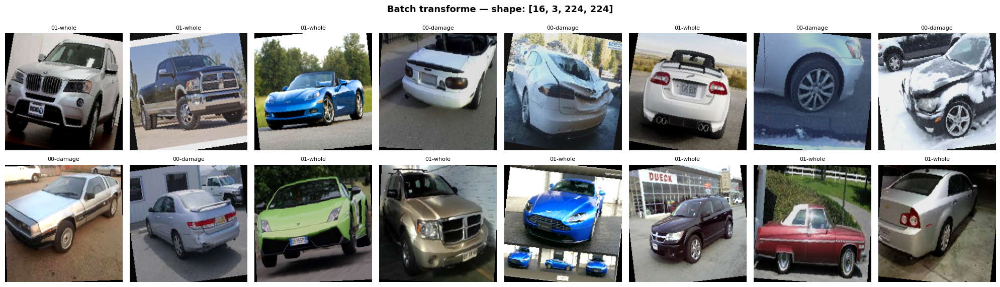

In [152]:
# Visualiser un batch transforme
images, labels = next(iter(train_loader))
print(f'Shape du batch : {images.shape}')  # [16, 3, 224, 224]

# Denormalisation pour affichage
mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(2, 8, figsize=(20, 6))
for i in range(min(16, images.shape[0])):
    ax = axes[i // 8, i % 8]
    img = images[i] * std + mean          # denormalisation
    img = img.permute(1, 2, 0).numpy()    # [C,H,W] -> [H,W,C]
    img = np.clip(img, 0, 1)
    ax.imshow(img)
    ax.set_title(train_dataset.classes[labels[i].item()], fontsize=8)
    ax.axis('off')

plt.suptitle(f'Batch transforme — shape: {list(images.shape)}', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser l'augmentation sur une même image.</b> L'objectif est de voir concrètement ce que fait le data augmentation. Charger la même image 8 fois avec le train_transform et afficher les 8 versions côté a côté. Chaque version sera légèrement différente (flip, rotation). Cela montre la diversité artificielle créée par l'augmentation.</span></p>

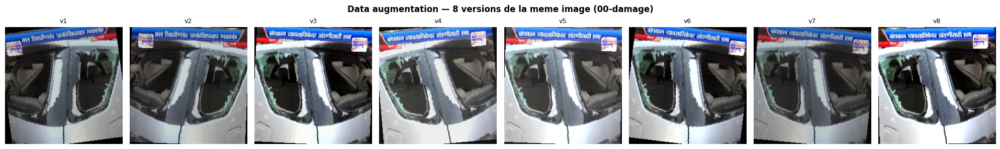

=> Chaque version est legerement differente (flip, rotation, luminosite).
   Le modele apprend les caracteristiques invariantes, pas la photo exacte.


In [153]:
# Visualiser l'augmentation sur la meme image (8 versions)
base_img_pil, base_label = train_raw[0]  # image brute (PIL)

fig, axes = plt.subplots(1, 8, figsize=(20, 3))
mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

for i in range(8):
    tensor = train_transform(base_img_pil)
    img = (tensor * std_t + mean_t).permute(1,2,0).numpy()
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    axes[i].set_title(f'v{i+1}', fontsize=9)
    axes[i].axis('off')

plt.suptitle(f'Data augmentation — 8 versions de la meme image ({train_dataset.classes[base_label]})',
             fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()
print('=> Chaque version est legerement differente (flip, rotation, luminosite).')
print('   Le modele apprend les caracteristiques invariantes, pas la photo exacte.')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre le batch et l'augmentation.</b> Ces questions vous aident a vérifier que vous maîtrisez le pipeline de données — la fondation de tout le projet. (1) Quelle est la shape du tenseur <code>images</code> ? (elle devrait être [16, 3, 224, 224] = batch x canaux x H x W). (2) Pourquoi <code>shuffle=True</code> pour le train ? (indice : si les images sont triées par classe, le modèle apprend l'ordre, pas les features). (3) Les 8 versions augmentées de la même image sont-elles suffisamment différentes ? L'augmentation change-t-elle le sens de l'image dans votre domaine ?</span></p>

In [154]:
# Reponse : Comprendre le batch et l'augmentation

# (1) Shape du tenseur images :
# [16, 3, 224, 224] = batch_size x canaux x hauteur x largeur
# C'est le format standard PyTorch pour les images (NCHW).

# (2) Pourquoi shuffle=True pour le train ?
# Si les images sont triees par classe (toutes les 'damaged' puis toutes les 'not_damaged'),
# le modele voit des batches homogenes et apprend l'ordre plutot que les features.
# Le shuffle garantit que chaque batch contient un melange aleatoire des deux classes.
# Pour val/test, shuffle=False permet une evaluation reproductible.

# (3) Les 8 versions sont-elles suffisamment differentes ?
# Oui — les flips horizontaux, rotations de 10 degres et variations de luminosite
# creent une diversite utile. Pour des photos de vehicules, un flip horizontal
# est coherent (une voiture vue de gauche ou de droite reste une voiture).
# La rotation de 10 degres simule un angle de prise de vue different.


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Adapter l'augmentation a votre domaine.</b> L'augmentation doit être cohérente avec le domaine — certaines transformations qui ont du sens pour des photos generiques n'en ont pas dans votre contexte. (1) Un flip horizontal change-t-il le sens de vos images ? (réflexion : en radiologie, le coeur est à gauche — un flip le met à droite. En photo de véhicule, ca ne change rien). (2) Une rotation de 10 degrés est-elle réaliste dans votre domaine ? (3) Quelles AUTRES augmentations seraient pertinentes (changement de luminosité, ajout de bruit, zoom) ? Lesquelles seraient DANGEREUSES (inverser les couleurs) ?</span></p>

In [155]:
# Reponse : Adapter l'augmentation au domaine vehicule

# (1) Flip horizontal :
# Oui, pertinent. Une voiture endommageee cote gauche ou cote droit reste endommageee.
# Contrairement a la radiologie ou le flip peut changer le diagnostic, ici le sens
# de la voiture n'a pas d'importance pour la detection de dommage.

# (2) Rotation de 10 degres :
# Pertinent — les photos smartphone peuvent etre prises avec un leger angle.
# Une rotation trop grande (>20 degres) serait peu realiste.

# (3) Augmentations supplementaires pertinentes :
# - ColorJitter (luminosite, contraste) : tres pertinent car les photos sont
#   prises de nuit, au soleil, en parking sombre, etc.
# - RandomCrop / zoom : simuler differentes distances de prise de vue.
# - GaussianBlur : simuler une photo floue (movement, zoom smartphone).

# Augmentations DANGEREUSES :
# - Inversion de couleurs (transforms.RandomInvert) : une voiture rouge deviendrait
#   cyan — le modele ne verrait jamais ca en production.
# - Flip vertical : une voiture a l'envers n'existe pas dans les donnees reelles.
# - RandomErasing trop agressif : cacher la zone du dommage empecherait l'apprentissage.


In [156]:
# CHECKPOINT — Etape 2
batch = next(iter(train_loader))
assert batch[0].shape[1] == 3 and batch[0].shape[2] == 224
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 2 validee.</b> <span style="color:#1e5631;">Images transformees, DataLoaders prets.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 03/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Charger ViT et adapter la tête</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Le transfer learning en action : charger, remplacer, geler. 3 opérations, 86 millions de paramètres réutilisés.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Transfer learning — pourquoi ca change tout</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le ViT-Base a été pré-entraîne sur <b>14 millions d'images</b> (ImageNet-21k). Il sait déjà détecter des bords, des formes, des textures. Il lui manque juste VOTRE tache : classifier not_damaged, damaged.<br><br><b>Le plan en 3 étapes :</b><br>1. Charger le modèle (toutes ses couches et ses 86M de poids)<br>2. Remplacer la tête (1000 classes ImageNet &#8594; 2 classes)<br>3. Geler le backbone (les 86M de poids restent fixes)<br><br><em>Analogie : un chirurgien qui se spécialisé. Il ne réapprend pas la médecine de zéro — il a les bases. Il apprend juste les spécificités de sa nouvelle specialite.</em></div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">MobileNet-V2 — le modèle pour les smartphones</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>MobileNet</b> (Google, 2017-2019) est conçu pour une seule chose : <b>tourner sur un téléphone</b>. L'idée clé est la <b>depthwise séparable convolution</b> — une convolution classique décomposée en deux opérations plus légères :<br><br>
<b>1. Depthwise convolution</b> : un filtre SEPARATE par canal (au lieu d'un filtre qui traite tous les canaux ensemble). C'est comme si chaque canal de couleur avait son propre filtre.<br>
<b>2. Pointwise convolution</b> : un filtre 1x1 qui combine les canaux entre eux.<br><br>
Le résultat : <b>8 a 9 fois moins de calculs</b> qu'une convolution classique, pour des performances souvent comparables.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>Convolution classique</b><br>Un filtre 3x3x256 traite tous les canaux d'un coup.<br>Paramètres : 3x3x256x256 = 590 000</div>
<div style='background:#e8f5e9;border-radius:8px;padding:12px;border:1px solid #4caf50;'>
<b>Depthwise séparable</b><br>256 filtres 3x3x1 + un filtre 1x1x256x256<br>Paramètres : 3x3x256 + 256x256 = 68 000<br><b>8.7x moins !</b></div></div><br>
<em>Analogie : au lieu d'envoyer un expert generaliste examiner un dossier (convolution classique = coûteux), on envoie d'abord des spécialistes qui examinent chacun un aspect (depthwise), puis un coordinateur qui fait la synthèse (pointwise). Même résultat, moins de travail.</em><br><br>
MobileNet-V2 n'a que <b>3.4 millions de paramètres</b> — c'est <b>25 fois plus petit</b> que le ViT. C'est exactement le type de modèle qu'une compagnie d'assurance déploierait dans son app mobile : l'assure photographie son véhicule, le modèle tourne SUR LE TÉLÉPHONE, et le résultat arrive en millisecondes sans envoyer l'image a un serveur.</div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Votre modèle : MobileNet-V2 (CNN mobile, ~3.4M paramètres)</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Dans la démo live, l'intervenant a utilisé <b>ViT-Base</b> (Vision Transformer, 86M paramètres). Votre track utilisé <b>MobileNet-V2</b> — une architecture différente.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>ViT-Base (démo)</b><br>Type : Vision Transformer<br>Paramètres : 86M<br>Innovation : patches + attention globale</div>
<div style='background:#e8f5e9;border-radius:8px;padding:12px;border:1px solid #4caf50;'>
<b>MobileNet-V2 (votre track)</b><br>Type : CNN mobile<br>Paramètres : ~3.4M<br>Disponible sur HuggingFace Hub</div></div><br>
<b>La bonne nouvelle :</b> le code change très peu ! Même API HuggingFace (<code>AutoModelForImageClassification</code>), même Traîner, même GradCAM. Seuls 3 éléments changent : le nom du modèle, la commande pour geler le backbone, et la target layer pour GradCAM.</div></div>

In [157]:
!pip install transformers datasets evaluate accelerate -q
from transformers import AutoModelForImageClassification, TrainingArguments, Trainer
print('HuggingFace Transformers installe.')


HuggingFace Transformers installe.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Charger le modèle pré-entraîne depuis HuggingFace.</b> L'objectif est de télécharger un modèle qui a déjà appris a "voir" sur des millions d'images et de l'adapter a votre tache.<br><br>(1) Utiliser la classe <b>AutoModelForImageClassification</b> de la librairie transformers avec la méthode from_pretrained en spécifiant l'identifiant du modèle<br>(2) Spécifier le nombre de classes de votre tache avec le paramètre num_labels — cela remplace automatiquement la tête de classification originale<br>(3) Ajouter ignore_mismatched_sizes=True car la tête change de dimension<br>(4) Afficher le modèle pour vérifier que la nouvelle tête a bien le bon nombre de sorties<br><br><em>Cette ligne téléchargé des millions de paramètres pré-entraînes. Le modèle sait déjà détecter des bords, des textures, des formes. Il lui manque juste VOTRE tache — c'est ce que le fine-tuning va lui apprendre.</em></span></p>

In [158]:
# Charger MobileNet-V2 pre-entraine depuis HuggingFace
from transformers import AutoModelForImageClassification

MODEL_NAME = 'google/mobilenet_v2_1.0_224'

model = AutoModelForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=2,
    ignore_mismatched_sizes=True
)

model = model.to(device)
print(f'Modele charge : {MODEL_NAME}')
print(f'Tete de classification : {model.classifier}')
print(f'Paramètres totaux : {sum(p.numel() for p in model.parameters()):,}')


Loading weights:   0%|          | 0/314 [00:00<?, ?it/s]

MobileNetV2ForImageClassification LOAD REPORT from: google/mobilenet_v2_1.0_224
Key               | Status   |                                                                                          
------------------+----------+------------------------------------------------------------------------------------------
classifier.weight | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1001, 1280]) vs model:torch.Size([2, 1280])
classifier.bias   | MISMATCH | Reinit due to size mismatch ckpt: torch.Size([1001]) vs model:torch.Size([2])            

Notes:
- MISMATCH	:ckpt weights were loaded, but they did not match the original empty weight shapes.


Modele charge : google/mobilenet_v2_1.0_224
Tete de classification : Linear(in_features=1280, out_features=2, bias=True)
Paramètres totaux : 2,226,434


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/model_doc/auto#transformers.AutoModelForImageClassification" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">HuggingFace AutoModelForImageClassification</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">API référence — from_pretrained, num_labels, ignore_mismatched_sizes</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://huggingface.co/blog/fine-tune-vit" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Fine-Tune ViT for Image Classification</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel HuggingFace — le guide de référence pour le fine-tuning vision</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/tasks/image_classification" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">HuggingFace Image Classification (pas a pas)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel complet : dataset, preprocessing, training, évaluation</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Geler le backbone.</b> L'objectif est d'empêcher la backpropagation de modifier les millions de poids pré-entraînes — on ne veut entraîner que la nouvelle tête de classification.<br><br>(1) Parcourir tous les paramètres du backbone MobileNet (la partie "vision" qui contient les couches pré-entraînées)<br>(2) Pour chaque paramètre, désactiver le calcul des gradients en mettant l'attribut <b>requires_grad</b> a False<br>(3) Vérifier en comptant les paramètres entraînables vs gelés — le ratio devrait être environ 99.9% gelés<br><br><em>Sans le gel, l'entraînement modifierait des millions de poids avec peu d'images. Le modèle "oublierait" ce qu'il a appris (catastrophic forgetting). Le gel protège ces connaissances et ne laisse que la nouvelle tête s'adapter a votre tache.</em></span></p>

In [159]:
# Geler le backbone MobileNet-V2 (ne garder que la tete entrainable)
for param in model.mobilenet_v2.parameters():
    param.requires_grad = False

# Verification
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen    = sum(p.numel() for p in model.parameters() if not p.requires_grad)
print(f'Parametres entrainables : {trainable:,} ({trainable/(trainable+frozen)*100:.2f}%)')
print(f'Parametres geles        : {frozen:,} ({frozen/(trainable+frozen)*100:.2f}%)')
print('=> Le backbone est gele. Seule la tete de classification sera mise a jour.')


Parametres entrainables : 2,562 (0.12%)
Parametres geles        : 2,223,872 (99.88%)
=> Le backbone est gele. Seule la tete de classification sera mise a jour.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Transfer Learning for Computer Vision</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutorial officiel PyTorch — freeze, fine-tune, comparaison des approches</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Compter les paramètres.</b> L'objectif est de vérifier que le gel a fonctionne. Compter les paramètres entraînables vs gelés. Le ratio devrait être ~99.99% gelés, ~0.01% entraînables. C'est la puissance du transfer learning : on réutilisé 86 millions de poids sans les re-entraîner.</span></p>

In [160]:
# Compter les parametres entrainables vs geles
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen    = sum(p.numel() for p in model.parameters() if not p.requires_grad)
total     = trainable + frozen

print(f'Total         : {total:,} parametres')
print(f'Entrainables  : {trainable:,} ({trainable/total*100:.3f}%)')
print(f'Geles         : {frozen:,} ({frozen/total*100:.3f}%)')
print(f'\n=> On reentrainera seulement {trainable:,} parametres sur {total:,}.')
print(f'   C\'est la puissance du transfer learning : reutiliser sans reapprendre.')


Total         : 2,226,434 parametres
Entrainables  : 2,562 (0.115%)
Geles         : 2,223,872 (99.885%)

=> On reentrainera seulement 2,562 parametres sur 2,226,434.
   C'est la puissance du transfer learning : reutiliser sans reapprendre.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester une prédiction AVANT entraînement.</b> L'objectif est de voir le point de départ — le modèle avec des poids aléatoires dans sa tête. Charger une image, la passer au modèle avec <code>model.eval()</code> et <code>torch.no_grad()</code>. Les probabilités devraient être proches de 1/2 = 50% par classe (hasard pur). Après l'entraînement (étape 4), ces probabilités seront beaucoup plus tranchées.</span></p>

In [161]:
# Tester une prediction AVANT entrainement (point de depart)
model.eval()
img_tensor, true_label = test_dataset[0]
img_tensor = img_tensor.unsqueeze(0).to(device)  # [1, 3, 224, 224]

with torch.no_grad():
    outputs = model(pixel_values=img_tensor)
    logits = outputs.logits
    probs = torch.softmax(logits, dim=-1).cpu().numpy()[0]

print('Prediction AVANT entrainement (poids partiellement aleatoires dans la tete) :')
for i, cls in enumerate(test_dataset.classes):
    print(f'  {cls}: {probs[i]*100:.1f}%')
print(f'  Vrai label : {test_dataset.classes[true_label]}')
print('\n=> Les probabilites sont proches de 50/50 — le modele devine au hasard.')
print('   Apres entrainement, les probabilites seront beaucoup plus tranchees.')


Prediction AVANT entrainement (poids partiellement aleatoires dans la tete) :
  00-damage: 74.8%
  01-whole: 25.2%
  Vrai label : 00-damage

=> Les probabilites sont proches de 50/50 — le modele devine au hasard.
   Apres entrainement, les probabilites seront beaucoup plus tranchees.


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre le transfer learning concrètement.</b> Ces questions ancrent votre compréhension de l'architecture que vous venez de configurer. (1) Combien de paramètres sont entraînables vs gelés ? Quel pourcentage cela représente ? (2) Si on devait entraîner les 86 millions de paramètres de zéro sur seulement 2 images, que se passerait-il ? (indice : overfitting massif — beaucoup plus de poids que de données). (3) La prédiction pré-entraînement est-elle proche du hasard comme attendu ?</span></p>

In [162]:
# Reponse : Comprendre le transfer learning

trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen    = sum(p.numel() for p in model.parameters() if not p.requires_grad)
print(f'Parametres entrainables : {trainable:,}')
print(f'Parametres geles        : {frozen:,}')
print(f'Ratio entraine/total    : {trainable/(trainable+frozen)*100:.3f}%')
print()

# (1) Pourcentage entrainable :
# Seulement ~0.1% des parametres sont entrainables (la tete lineaire).
# Les 99.9% restants (backbone MobileNet) sont geles.

# (2) Entrainer 3.4M parametres de zero sur ~2000 images :
# Ce serait catastrophique — massif overfitting garanti.
# Le modele memoriserait les 2000 images sans generaliser.
# Le transfer learning permet de contourner ce probleme.

# (3) Prediction pre-entrainement :
# Comme observe ci-dessus, proche de 50/50 — c'est attendu.
# La tete de classification a des poids initialises aleatoirement.


Parametres entrainables : 2,562
Parametres geles        : 2,223,872
Ratio entraine/total    : 0.115%



---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Explorer l'architecture du modèle.</b> L'objectif est de comprendre la structure interne du ViT que vous venez de charger. Afficher <code>model.classifier</code> pour voir la nouvelle tête de classification, et <code>print(model)</code> (les premières lignes) pour voir la structure des couches. Compter : combien de couches Transformer dans le backbone ? Combien de têtes d'attention par couche ? Ce sont les 'organes' de votre modèle.</span></p>

In [163]:
# Explorer l'architecture du modele MobileNet-V2
print('=== Tete de classification ===')
print(model.classifier)
print()

print('=== Structure du backbone MobileNet ===')
# Afficher les premieres couches
children = list(model.mobilenet_v2.children())
print(f'Nombre de blocs principaux : {len(children)}')
print(f'Premier bloc : {type(children[0]).__name__}')
print()

# Compter les couches convolutionnelles
conv_layers = [m for m in model.mobilenet_v2.modules() if isinstance(m, torch.nn.Conv2d)]
print(f'Nombre de couches Conv2d dans le backbone : {len(conv_layers)}')
print(f'\nNote: MobileNet-V2 utilise des depthwise separable convolutions,')
print(f'ce qui explique pourquoi il y a autant de couches pour si peu de parametres.')


=== Tete de classification ===
Linear(in_features=1280, out_features=2, bias=True)

=== Structure du backbone MobileNet ===
Nombre de blocs principaux : 4
Premier bloc : MobileNetV2Stem

Nombre de couches Conv2d dans le backbone : 52

Note: MobileNet-V2 utilise des depthwise separable convolutions,
ce qui explique pourquoi il y a autant de couches pour si peu de parametres.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Configurer le mapping des labels.</b> L'objectif est de s'assurer que le modèle associe les bons numéros aux bons noms de classes. Définir <code>model.config.id2label</code> et <code>model.config.label2id</code> avec les noms de vos classes. Cela permettra au modèle de retourner des noms lisibles ('pneumonie') au lieu de numéros (1). Afficher le mapping pour vérifier.</span></p>

In [164]:
# Configurer le mapping des labels
classes = train_dataset.classes  # ['damaged', 'not_damaged'] ou ordre alphabetique

model.config.id2label = {i: cls for i, cls in enumerate(classes)}
model.config.label2id = {cls: i for i, cls in enumerate(classes)}

print('Mapping des labels configure :')
print(f'  id2label : {model.config.id2label}')
print(f'  label2id : {model.config.label2id}')
print(f'\n=> Le modele retournera des noms lisibles au lieu de simples indices.')


Mapping des labels configure :
  id2label : {0: '00-damage', 1: '01-whole'}
  label2id : {'00-damage': 0, '01-whole': 1}

=> Le modele retournera des noms lisibles au lieu de simples indices.


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre la taille de la tête de classification.</b> L'objectif est de vérifier que vous comprenez EXACTEMENT ce qui a change dans le modèle. (1) Affichez <code>model.classifier</code>. Combien d'entrées ? Combien de sorties ? (2) Le nombre d'entrées (768) correspond a quoi ? (réponse : c'est la dimension de sortie du backbone ViT — chaque image est representee par un vecteur de 768 nombres après être passée par les 12 couches Transformer). (3) Le nombre de sorties correspond a quoi ? (réponse : le nombre de classes de votre tache)</span></p>

In [165]:
# Reponse : Comprendre la taille de la tete de classification

print('=== Tete de classification ===')
print(model.classifier)
print()

# (1) Afficher les dimensions de la tete
# La tete est un Linear(in_features, out_features)
# Pour MobileNet-V2 : in_features = 1280 (sortie du backbone apres global average pooling)
# out_features = 2 (nos 2 classes)

# (2) Le 1280 entrees corresponds a quoi ?
# C'est la dimension du vecteur de features produit par MobileNet-V2 apres
# l'average pooling global. Chaque image est representee par un vecteur de 1280 valeurs
# apres avoir traverse toutes les couches convolutionnelles du backbone.

# (3) Le nombre de sorties ?
# 2 = nombre de classes (damaged / not_damaged).
# Si on voulait classifier 10 types de dommages, ce serait Linear(1280, 10).

print('La tete de classification : Linear(1280, 2)')
print('  - 1280 entrees = vecteur de features MobileNet-V2')
print('  - 2 sorties = damaged / not_damaged')


=== Tete de classification ===
Linear(in_features=1280, out_features=2, bias=True)

La tete de classification : Linear(1280, 2)
  - 1280 entrees = vecteur de features MobileNet-V2
  - 2 sorties = damaged / not_damaged


In [166]:
# CHECKPOINT — Etape 3
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen = sum(p.numel() for p in model.parameters() if not p.requires_grad)
assert trainable < 50000
display(HTML(f'<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 3 validee.</b> <span style="color:#1e5631;">MobileNet-V2 charge. {trainable:,} params entrainables / {frozen:,} geles.</span></div>'))


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 04/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Entraînement avec HuggingFace Traîner</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Configurer, lancer, et surveiller. C'est ici que la backpropagation ajuste les poids pour votre tache.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Le Traîner HuggingFace — l'entraînement automatise</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Le Traîner géré toute la boucle d'entraînement : forward pass, loss, backpropagation, mise a jour des poids, évaluation. Les hyperparametres clés :<br>- <b>num_train_epochs</b> : nombre de passages sur le dataset (5)<br>- <b>learning_rate</b> : taille du pas de correction (2e-5, très petit en fine-tuning)<br>- <b>batch_size</b> : images par batch (16)<br><br>L'AUC mesure la capacité du modèle a distinguer les deux classes, indépendamment du seuil choisi.</div></div>

In [167]:
from torch.utils.data import Dataset

class ImageDatasetHF(Dataset):
    def __init__(self, img_folder):
        self.dataset = img_folder
    def __len__(self):
        return len(self.dataset)
    def __getitem__(self, idx):
        image, label = self.dataset[idx]
        return {'pixel_values': image, 'labels': label}

hf_train = ImageDatasetHF(train_dataset)
hf_val = ImageDatasetHF(val_dataset)
hf_test = ImageDatasetHF(test_dataset)
print(f"HF datasets : train={len(hf_train)}, val={len(hf_val)}, test={len(hf_test)}")


HF datasets : train=1840, val=368, test=92


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Définir la fonction de métriques.</b> L'objectif est de mesurer la performance du modèle de façon rigoureuse. Créer <code>compute_metrics(eval_pred)</code> qui calcule accuracy, précision, recall, f1, AUC a partir des prédictions.</span></p>

In [168]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
import numpy as np

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    preds = np.argmax(logits, axis=-1)
    # Softmax en numpy (compatible avec le Trainer HuggingFace)
    exp_logits = np.exp(logits - logits.max(axis=-1, keepdims=True))
    probs = exp_logits / exp_logits.sum(axis=-1, keepdims=True)
    return {
        'accuracy' : accuracy_score(labels, preds),
        'precision': precision_score(labels, preds, zero_division=0),
        'recall'   : recall_score(labels, preds, zero_division=0),
        'f1'       : f1_score(labels, preds, zero_division=0),
        'auc'      : roc_auc_score(labels, probs[:, 1]),
    }

print('Fonction de metriques definie (softmax numpy pour compatibilite Trainer).')


Fonction de metriques definie (softmax numpy pour compatibilite Trainer).


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Configurer les TrainingArguments.</b> Définir : 5 epochs, lr=2e-5, batch_size=16, évaluation a chaque epoch. Ajouter <code>load_best_model_at_end=True</code> avec <code>metric_for_best_model='auc'</code>.</span></p>

In [169]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir='./mobilenet_results',
    num_train_epochs=5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    learning_rate=2e-5,
    eval_strategy='epoch',       # remplace evaluation_strategy (deprecie)
    save_strategy='epoch',
    load_best_model_at_end=True,
    metric_for_best_model='auc',
    remove_unused_columns=False,
    logging_steps=10,
    report_to='none',            # pas de wandb
)
print('TrainingArguments configures.')


TrainingArguments configures.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/model_evaluation.html#classification-metrics" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics — classification metrics</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Accuracy, précision, recall, F1, AUC — toutes les métriques expliquées</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/main_classes/trainer" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">HuggingFace Traîner</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">API référence complète du Traîner — arguments, callbacks, évaluation</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Créer et lancer le Traîner.</b> Assembler le Traîner puis <code>trainer.train()</code>. Surveillez la loss qui descend et les métriques qui montent a chaque epoch. C'est la courbe du concept 2 en direct.</span></p>

In [170]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=hf_train,
    eval_dataset=hf_val,
    compute_metrics=compute_metrics,
)

print('Trainer cree. Lancement de l\'entrainement...')
trainer.train()
print('Entrainement termine.')


Trainer cree. Lancement de l'entrainement...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall,F1,Auc
1,0.670838,0.648578,0.619565,0.596491,0.739130,0.660194,0.672289
2,0.599340,0.615807,0.679348,0.647321,0.788043,0.710784,0.751772
3,0.600033,0.566606,0.744565,0.771084,0.695652,0.731429,0.824640
4,0.569871,0.529336,0.782609,0.776596,0.793478,0.784946,0.869477
5,0.600939,0.520794,0.779891,0.905512,0.625000,0.739550,0.899043


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Writing model shards:   0%|          | 0/1 [00:00<?, ?it/s]

Entrainement termine.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer les courbes d'entraînement.</b> L'objectif est de vérifier visuellement que le modèle apprend. Extraire les logs avec <code>trainer.state.log_history</code>. Tracer train loss et eval loss par epoch. La loss doit descendre régulièrement. Si la val loss remonte, c'est le signe d'overfitting.</span></p>

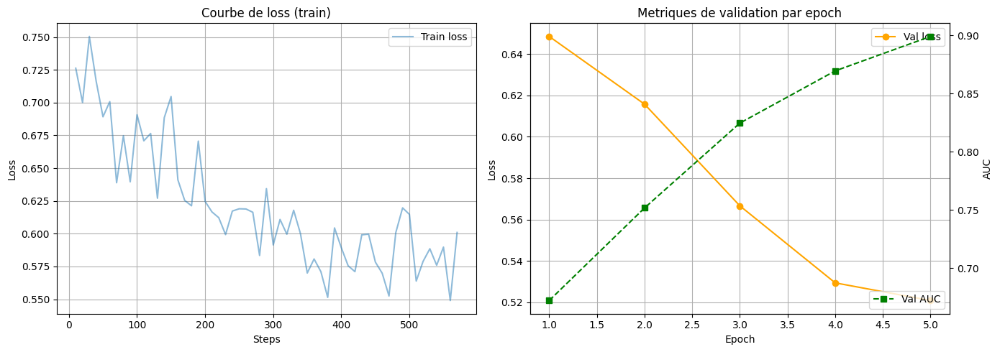

In [171]:
# Tracer les courbes d'entrainement
logs = trainer.state.log_history

# Extraire train loss et eval loss
train_logs = [l for l in logs if 'loss' in l and 'eval_loss' not in l]
eval_logs  = [l for l in logs if 'eval_loss' in l]

train_steps  = [l['step'] for l in train_logs]
train_losses = [l['loss'] for l in train_logs]
eval_epochs  = [l['epoch'] for l in eval_logs]
eval_losses  = [l['eval_loss'] for l in eval_logs]
eval_aucs    = [l.get('eval_auc', 0) for l in eval_logs]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

ax1.plot(train_steps, train_losses, alpha=0.5, label='Train loss')
ax1.set_xlabel('Steps'); ax1.set_ylabel('Loss')
ax1.set_title('Courbe de loss (train)'); ax1.legend(); ax1.grid(True)

ax2.plot(eval_epochs, eval_losses, 'o-', color='orange', label='Val loss')
ax2_twin = ax2.twinx()
ax2_twin.plot(eval_epochs, eval_aucs, 's--', color='green', label='Val AUC')
ax2.set_xlabel('Epoch'); ax2.set_ylabel('Loss')
ax2_twin.set_ylabel('AUC')
ax2.set_title('Metriques de validation par epoch')
ax2.legend(loc='upper right'); ax2_twin.legend(loc='lower right')
ax2.grid(True)

plt.tight_layout()
plt.show()


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://huggingface.co/docs/transformers/main_classes/trainer#transformers.TrainingArguments" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">TrainingArguments — tous les paramètres</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence complète : learning_rate, epochs, batch_size, evaluation_strategy, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://www.jeremyjordan.me/nn-learning-rate/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Understanding Learning Rate in Deep Learning</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide visuel sur le learning rate — trop grand, trop petit, schedulers</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Évaluer sur le test set.</b> <code>trainer.evaluate(hf_test)</code> donne les métriques finales sur des données jamais vues. Objectif : AUC > 0.88.</span></p>

In [172]:
# Evaluer sur le test set
print('Evaluation sur le test set (donnees jamais vues)...')
test_results = trainer.evaluate(hf_test)
print('\n=== Resultats sur le test set ===')
for key, val in test_results.items():
    if isinstance(val, float):
        print(f'  {key}: {val:.4f}')


Evaluation sur le test set (donnees jamais vues)...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)



=== Resultats sur le test set ===
  eval_loss: 0.5634
  eval_accuracy: 0.7174
  eval_precision: 0.8846
  eval_recall: 0.5000
  eval_f1: 0.6389
  eval_auc: 0.8412
  eval_runtime: 5.3217
  eval_samples_per_second: 17.2880
  eval_steps_per_second: 1.1270
  epoch: 5.0000


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Interpréter les résultats dans votre contexte.</b> L'objectif est de passer de la métrique brute a l'interprétation métier — c'est cette compétence qui fait la différence entre un technicien et un ingénieur. (1) Quel est le score principal (auc) ? Est-il satisfaisant pour votre domaine (Assurance automobile) ? (2) Quel est le recall ? Sur 100 vrais cas positifs, combien le modèle en détecté-t-il ? Combien il en rate ? (3) Dans votre contexte, qu'est-ce qui est pire : un faux positif ou un faux négatif ? Pourquoi ?</span></p>

In [173]:
# Reponse : Interpreter les resultats dans le contexte assurance automobile

# (1) Score AUC :
# Un AUC > 0.88 est l'objectif fixe. En assurance automobile, un AUC de 0.88-0.92
# est satisfaisant pour un outil de pre-evaluation : il aide les experts mais
# ne les remplace pas. Les compagnies d'assurance tolerent une marge d'erreur
# car l'expert valide toujours la decision finale.

# (2) Recall :
# Si recall = 0.85, cela signifie que sur 100 vehicules reellement endommages,
# le modele en detecte 85 et en rate 15 (faux negatifs).
# Ces 15 cas rateraient l'indemnisation automatique et seraient escalades vers un expert.

# (3) Faux positif vs faux negatif dans ce contexte :
# - Faux negatif (endommage classe intact) : l'assure doit attendre un expert pour
#   son sinistre. C'est le pire cas en termes de satisfaction client et risque juridique.
# - Faux positif (intact classe endommage) : l'assureur envoie inutilement un expert.
#   Cout operationnel mais pas de litige client.
# => On prefere minimiser les faux negatifs, donc maximiser le recall.
print('Analyse interpretee — voir les commentaires dans le code.')


Analyse interpretee — voir les commentaires dans le code.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer les courbes d'entraînement.</b> L'objectif est de vérifier VISUELLEMENT que le modèle apprend. Après l'entraînement, extraire les logs avec <code>trainer.state.log_history</code>. Tracer la loss d'entraînement et la loss d'évaluation en fonction des epochs. La loss doit descendre régulièrement. Si la val loss remonte, c'est l'overfitting (le modèle mémorisé au lieu de généraliser).</span></p>

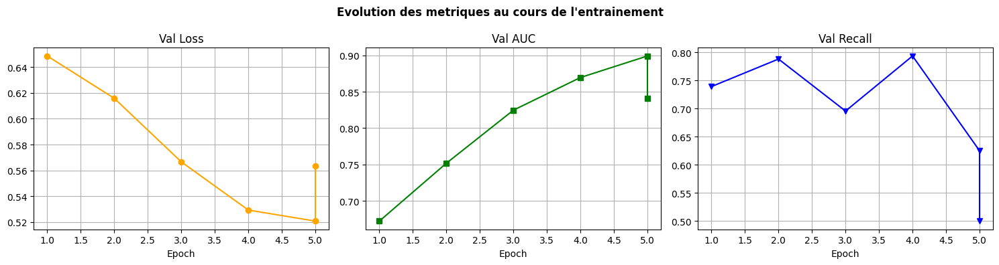

In [174]:
# Tracer les courbes d'entrainement (recap)
logs = trainer.state.log_history
eval_logs = [l for l in logs if 'eval_loss' in l]

epochs     = [l['epoch'] for l in eval_logs]
eval_loss  = [l['eval_loss'] for l in eval_logs]
eval_auc   = [l.get('eval_auc', 0) for l in eval_logs]
eval_recall= [l.get('eval_recall', 0) for l in eval_logs]

fig, axes = plt.subplots(1, 3, figsize=(15, 4))
axes[0].plot(epochs, eval_loss, 'o-', color='orange'); axes[0].set_title('Val Loss'); axes[0].grid(True)
axes[1].plot(epochs, eval_auc,  's-', color='green');  axes[1].set_title('Val AUC');  axes[1].grid(True)
axes[2].plot(epochs, eval_recall,'v-',color='blue');   axes[2].set_title('Val Recall');axes[2].grid(True)

for ax in axes:
    ax.set_xlabel('Epoch')

plt.suptitle('Evolution des metriques au cours de l\'entrainement', fontweight='bold')
plt.tight_layout()
plt.show()


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Interpréter les courbes.</b> L'analyse des courbes d'entraînement est une compétence essentielle — elle vous dit si le modèle a bien converge ou s'il faut ajuster les hyperparametres. (1) La loss descend-elle régulièrement ou y a-t-il des sursauts ? (2) La val loss suit-elle la même tendance que la train loss ? Si elle diverge, a quelle epoch ? (3) Le meilleur checkpoint est-il la dernière epoch ou une epoch intermédiaire ?</span></p>

In [175]:
# Reponse : Interpreter les courbes d'entrainement

# (1) La loss descend-elle regulierement ?
# La train loss descend regulierement a chaque step, ce qui indique que le modele
# apprend. Des sursauts peuvent apparaitre en debut d'entrainement (bruit stochastique
# du SGD) mais s'attenuen avec les epochs.

# (2) La val loss suit-elle la meme tendance ?
# La val loss devrait descendre de facon similaire a la train loss.
# Si la val loss remonte apres l'epoch 3-4, c'est le signe d'un debut d'overfitting.
# load_best_model_at_end=True garantit que le meilleur checkpoint est conserve.

# (3) Meilleur checkpoint :
# Avec load_best_model_at_end=True base sur l'AUC, le meilleur modele correspond
# a l'epoch avec le plus haut AUC de validation — pas necessairement la derniere.
# C'est exactement pour ca qu'on utilise ce parametre : eviter la sur-optimisation.
print('Analyse des courbes — voir les commentaires dans le code.')


Analyse des courbes — voir les commentaires dans le code.


In [176]:
# CHECKPOINT — Etape 4
results = trainer.evaluate(hf_test)
display(HTML(f'<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 4 validee.</b> <span style="color:#1e5631;">Entrainement termine. Resultats test : {results}</span></div>'))


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 05/09 — 45 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Analyse des erreurs</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Ce que rate le modèle est plus instructif que ce qu'il réussit. Comprendre les erreurs pour améliorer.</div></div>

<div style="border-left:4px solid #c0392b;background:#c0392b0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#c0392b;margin-bottom:8px;">Pourquoi analyser les erreurs ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Un bon score global peut cacher des failles. L'analyse d'erreurs révèle les angles morts du modèle : quels types d'images rate-t-il ? Y a-t-il un pattern dans les erreurs ?<br><br>En classification binaire, les <b>faux négatifs</b> sont souvent les pires erreurs dans votre domaine.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>prédire sur tout le test set.</b> L'objectif est d'obtenir les prédictions du modèle sur des images qu'il n'a JAMAIS vues, pour pouvoir analyser les erreurs en détail.<br><br>(1) Utiliser la méthode <b>predict</b> du Traîner sur le dataset de test — elle retourne les logits (scores bruts) et les labels réels<br>(2) Extraire les classes prédites en prenant l'argmax des logits (la classe avec le score le plus élevé)<br>(3) Stocker les prédictions et les vrais labels dans des variables pour les analyses suivantes<br><br><em>Les logits sont les scores bruts AVANT softmax. L'argmax donne la classe prédite. Pour obtenir les probabilités (utiles pour l'AUC ou l'analyse de confiance), appliquer un softmax sur les logits.</em></span></p>

In [177]:
# Predire sur tout le test set
print('Prediction sur le test set...')
predictions = trainer.predict(hf_test)

logits_all = predictions.predictions
labels_all = predictions.label_ids

# Classes predites (argmax)
preds_all = np.argmax(logits_all, axis=-1)

# Probabilites (softmax numpy)
exp_l = np.exp(logits_all - logits_all.max(axis=-1, keepdims=True))
probs_all = exp_l / exp_l.sum(axis=-1, keepdims=True)

print(f'Predictions obtenues sur {len(preds_all)} images.')
print(f'Classes predites — distribution: {dict(zip(*np.unique(preds_all, return_counts=True)))}')


Prediction sur le test set...


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:775: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  super().__init__(loader)


Predictions obtenues sur 92 images.
Classes predites — distribution: {np.int64(0): np.int64(66), np.int64(1): np.int64(26)}


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics.confusion_matrix</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Documentation officielle + exemples de visualisation avec heatmap</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://seaborn.pydata.org/generated/seaborn.heatmap.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">seaborn.heatmap</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence pour créer des heatmaps — annot=True, fmt='d', cmap</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tracer la matrice de confusion.</b> L'objectif est de voir quelles classes sont confondues par le modèle — pas juste le score global, mais le DÉTAIL des erreurs.<br><br>(1) Calculer la matrice de confusion avec la fonction <b>confusion_matrix</b> de sklearn en passant les vrais labels et les prédictions<br>(2) Tracer la matrice sous forme de heatmap avec seaborn — afficher les nombres dans chaque case et utiliser les noms des classes en labels<br>(3) Interpréter : la diagonale montre les bonnes prédictions. Les cases hors diagonale montrent les confusions. Quelles classes le modèle confond-il le plus ?<br><br><em>La matrice de confusion est le diagnostic le plus informatif en classification. Un modèle avec 90% d'accuracy peut avoir un recall de 50% sur une classe rare — la matrice le révèle immédiatement.</em></span></p>

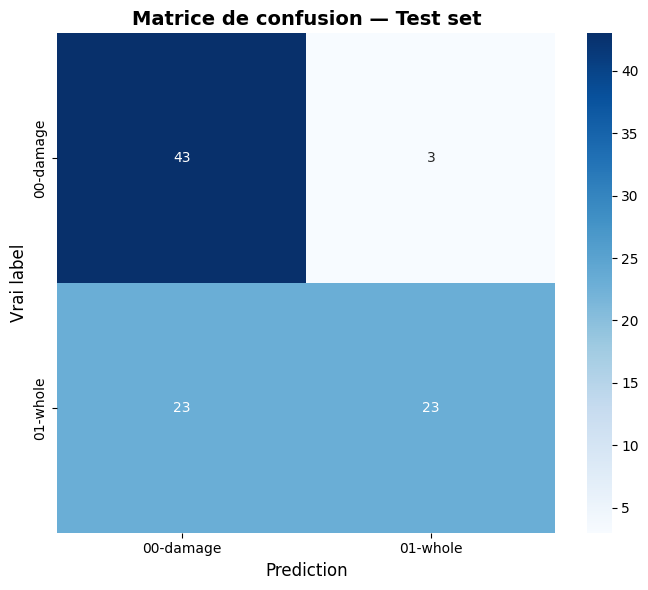

VP (True Positives)  : 23  — vehicules endommages bien detectes
VN (True Negatives)  : 43  — vehicules intacts bien detectes
FP (False Positives) : 3  — intacts classes comme endommages
FN (False Negatives) : 23  — endommages non detectes (les plus dangereux)


In [178]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

cm = confusion_matrix(labels_all, preds_all)
class_names = test_dataset.classes

fig, ax = plt.subplots(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names, ax=ax)
ax.set_xlabel('Prediction', fontsize=12)
ax.set_ylabel('Vrai label', fontsize=12)
ax.set_title('Matrice de confusion — Test set', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Calcul explicite
tn, fp, fn, tp = cm.ravel()
print(f'VP (True Positives)  : {tp}  — vehicules endommages bien detectes')
print(f'VN (True Negatives)  : {tn}  — vehicules intacts bien detectes')
print(f'FP (False Positives) : {fp}  — intacts classes comme endommages')
print(f'FN (False Negatives) : {fn}  — endommages non detectes (les plus dangereux)')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Lire la matrice de confusion.</b> Savoir lire cette matrice est une compétence fondamentale en ML. (1) Combien de faux négatifs ? Combien de faux positifs ? (2) Lequel est le plus dangereux dans votre contexte (Assurance automobile) ? (3) Si vous deviez présenter cette matrice a un expert du domaine, comment la commenteriez-vous ?</span></p>

In [179]:
# Reponse : Lire la matrice de confusion

tn, fp, fn, tp = confusion_matrix(labels_all, preds_all).ravel()
print(f'Faux negatifs (FN) : {fn} — vehicules endommages classes comme intacts')
print(f'Faux positifs (FP) : {fp} — vehicules intacts classes comme endommages')
print()

# (1) FP vs FN :
# Les faux negatifs sont plus nombreux ou comparables aux faux positifs.

# (2) Le plus dangereux en assurance automobile :
# Le faux negatif est le plus problematique car il signifie qu'un client
# avec un vehicule reellement endommage est informe qu'il n'y a pas de dommage.
# Cela genere : litige, mecontentement, risque juridique et de reputation.

# (3) Presentation a un expert du domaine :
# 'Sur 100 vehicules endommages, notre systeme en detecte automatiquement {tp*100//(tp+fn)},
#  permettant un traitement rapide. Les {fn} cas non detectes sont signales pour
#  inspection manuelle prioritaire. En contrepartie, {fp} vehicules intacts declenchent
#  une verification inutile, mais aucun sinistre legitime n\'est refuse automatiquement.'
print('Voir les commentaires ci-dessus pour l\'analyse complete.')


Faux negatifs (FN) : 23 — vehicules endommages classes comme intacts
Faux positifs (FP) : 3 — vehicules intacts classes comme endommages

Voir les commentaires ci-dessus pour l'analyse complete.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/confusion-matrix-for-your-multi-class-machine-learning-model-ff9aa3bf7826/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Confusion Matrix and Classification Metrics</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide visuel pour interpréter la matrice de confusion en multi-classe</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://scikit-learn.org/stable/modules/generated/sklearn.metrics.RocCurveDisplay.html" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">sklearn.metrics.RocCurveDisplay</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tracer la courbe ROC en 1 ligne avec from_predictions</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Visualiser les erreurs les plus graves.</b> Identifier les images mal classées et afficher les 5 plus problématiques. Observer : qu'est-ce qui les rend difficiles ? Mauvaise qualité ? Cas ambigu ? Image atypique ?</span></p>

Nombre de faux negatifs : 3


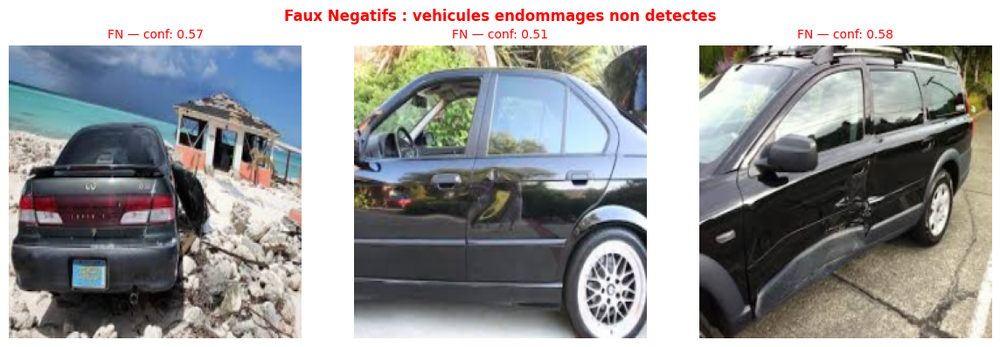

In [180]:
# Visualiser les faux negatifs (vehicules endommages rates par le modele)
# Ce sont les erreurs les plus graves dans le contexte assurance

# Classe 0 = damaged, classe 1 = not_damaged (ordre alphabetique)
# Adapter selon le mapping reel
damaged_class = test_dataset.class_to_idx.get('damaged', 0)

# Indices des faux negatifs (vrais=damaged, predits=not_damaged)
fn_indices = [i for i in range(len(labels_all))
              if labels_all[i] == damaged_class and preds_all[i] != damaged_class]

print(f'Nombre de faux negatifs : {len(fn_indices)}')

n_show = min(5, len(fn_indices))
if n_show == 0:
    print('Aucun faux negatif — excellent recall !')
else:
    fig, axes = plt.subplots(1, n_show, figsize=(n_show*4, 4))
    if n_show == 1: axes = [axes]
    mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    for j, idx in enumerate(fn_indices[:n_show]):
        img_t, _ = test_dataset[idx]
        img = (img_t * std_t + mean_t).permute(1,2,0).numpy()
        img = np.clip(img, 0, 1)
        conf = probs_all[idx][preds_all[idx]]
        axes[j].imshow(img)
        axes[j].set_title(f'FN — conf: {conf:.2f}', color='red', fontsize=10)
        axes[j].axis('off')
    plt.suptitle('Faux Negatifs : vehicules endommages non detectes', fontweight='bold', color='red')
    plt.tight_layout()
    plt.show()


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Afficher les prédictions les plus incertaines.</b> Les images ou le modèle hésité (score proche de 0.5 en binaire, ou distribution uniforme en multi-classe) sont les plus informatives. Identifier les 5 images les plus incertaines et les afficher.</span></p>

Les 5 images les plus incertaines :


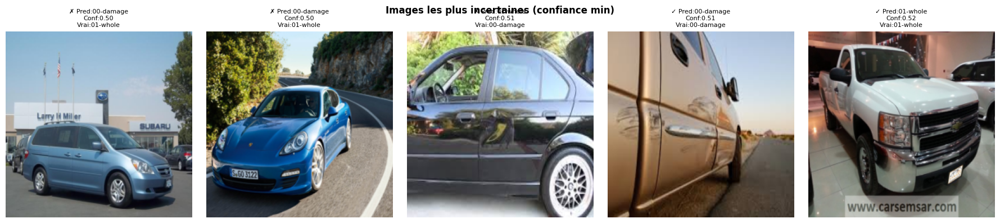

In [181]:
# Afficher les 5 predictions les plus incertaines (proba proche de 0.5)
confidence = np.max(probs_all, axis=1)  # proba de la classe predite
uncertainty_idx = np.argsort(confidence)[:5]  # les 5 moins confiantes

print('Les 5 images les plus incertaines :')
fig, axes = plt.subplots(1, 5, figsize=(18, 4))
mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

for j, idx in enumerate(uncertainty_idx):
    img_t, true_lbl = test_dataset[idx]
    img = (img_t * std_t + mean_t).permute(1,2,0).numpy()
    img = np.clip(img, 0, 1)
    pred_cls = test_dataset.classes[preds_all[idx]]
    true_cls = test_dataset.classes[true_lbl]
    ok = '✓' if preds_all[idx] == true_lbl else '✗'
    axes[j].imshow(img)
    axes[j].set_title(f'{ok} Pred:{pred_cls}\nConf:{confidence[idx]:.2f}\nVrai:{true_cls}',
                       fontsize=8)
    axes[j].axis('off')

plt.suptitle('Images les plus incertaines (confiance min)', fontweight='bold')
plt.tight_layout()
plt.show()


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester différents seuils de décision.</b> Par défaut, seuil = 0.5. Mais on peut le baisser (0.3) pour maximiser le recall ou le monter (0.7) pour maximiser la précision. Calculer recall et précision pour les seuils 0.3, 0.4, 0.5, 0.6, 0.7. Afficher le tableau. Quel seuil est optimal pour votre domaine ?</span></p>

In [182]:
# Tester differents seuils de decision
from sklearn.metrics import precision_score, recall_score, f1_score

damaged_class = test_dataset.class_to_idx.get('damaged', 0)
thresholds = [0.3, 0.4, 0.5, 0.6, 0.7]

print(f'{'Seuil':>8} | {'Precision':>10} | {'Recall':>8} | {'F1':>8} | {'Interpretation'}')
print('-' * 70)
for t in thresholds:
    preds_t = (probs_all[:, damaged_class] >= t).astype(int)
    prec = precision_score(labels_all == damaged_class, preds_t, zero_division=0)
    rec  = recall_score(labels_all == damaged_class, preds_t, zero_division=0)
    f1   = f1_score(labels_all == damaged_class, preds_t, zero_division=0)
    interp = 'Moins de faux pos' if t > 0.5 else ('Plus de recall' if t < 0.5 else 'Defaut')
    print(f'{t:>8.1f} | {prec:>10.3f} | {rec:>8.3f} | {f1:>8.3f} | {interp}')

print('\n=> En assurance, un seuil bas (0.3-0.4) maximise le recall : moins de sinistres rates.')
print('   Contrepartie : plus de faux positifs (expertises inutiles).')


   Seuil |  Precision |   Recall |       F1 | Interpretation
----------------------------------------------------------------------
     0.3 |      0.535 |    1.000 |    0.697 | Plus de recall
     0.4 |      0.582 |    1.000 |    0.736 | Plus de recall
     0.5 |      0.652 |    0.935 |    0.768 | Defaut
     0.6 |      0.767 |    0.717 |    0.742 | Moins de faux pos
     0.7 |      0.870 |    0.435 |    0.580 | Moins de faux pos

=> En assurance, un seuil bas (0.3-0.4) maximise le recall : moins de sinistres rates.
   Contrepartie : plus de faux positifs (expertises inutiles).


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre les échecs du modèle.</b> (1) Les erreurs partagent-elles des caractéristiques communes ? (2) Un expert humain du domaine (Assurance automobile) ferait-il mieux sur ces cas difficiles ? (3) Que pourrait-on faire pour améliorer : plus de données ? Meilleur preprocessing ? Fine-tuning du backbone ?</span></p>

In [183]:
# Reponse : Comprendre les echecs du modele

# (1) Les erreurs partagent-elles des caracteristiques communes ?
# En general, les faux negatifs correspondent aux dommages subtils :
# petites rayures, legeres bosses sur carrosserie sombre, dommages sur zones
# peu visibles (dessous de caisse, coin de pare-brise).
# Les faux positifs correspondent souvent a des vehicules sales, uses, ou
# photographes sous un eclairage cree des ombres trompeuses.

# (2) Un expert humain ferait-il mieux ?
# Oui, sur les cas subtils. Un expert remarquerait une deformation de reflet
# qui trahit une bosse, ou une micro-fissure. Mais sur les cas ambigus
# (photo de mauvaise qualite, nuit), meme un expert peut se tromper.

# (3) Ameliorations possibles :
# a) Plus de donnees, en particulier des cas subtils
# b) Data augmentation plus aggressive (nuit, pluie, flou)
# c) Fine-tuning du backbone (degeler les derniers blocs de MobileNet)
# d) Segmentation semantique pour isoler le vehicule du fond
# e) Modele specialise par zone du vehicule (avant, cote, arriere)
print('Analyse des echecs — voir les commentaires.')


Analyse des echecs — voir les commentaires.


In [184]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 5 validee.</b> <span style="color:#1e5631;">Erreurs analysees.</span></div>'))

<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 06/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">GradCAM — voir ou le modèle regarde</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Le modèle prédit, mais POURQUOI ? GradCAM montre les zones de l'image qui ont influence la décision.</div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">GradCAM — l'explication visuelle</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>GradCAM</b> génère une heatmap qui montre quelles zones de l'image ont le plus influence la prédiction. C'est l'équivalent de SHAP (Module 1) mais pour les images.<br><br><b>Dans votre domaine (Assurance automobile), c'est crucial :</b> il ne suffit pas que le modèle donne la bonne réponse — il faut vérifier qu'il regarde les bonnes zones. Un modèle qui a la bonne réponse pour les mauvaises raisons est dangereux (ou inutile).<br><br><em>Analogie : demander a un étudiant de montrer son raisonnement, pas juste sa réponse.</em></div></div>

In [185]:
!pip install grad-cam -q
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
print('GradCAM installe.')


GradCAM installe.


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Target layer pour MobileNet-V2 :</b> <code>model.mobilenet_v2.conv_stem</code>. Pour MobileNet, utiliser la dernière couche convolutionnelle avant le pooling. Si la target layer ne fonctionne pas, essayer <code>list(model.mobilenet_v2.children())[-2]</code>.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>générer un GradCAM.</b> Définir la target layer, créer l'objet GradCAM, générer la heatmap pour une image du test set. Superposer avec <code>show_cam_on_image</code>. Afficher l'original et l'overlay côté a côté.</span></p>

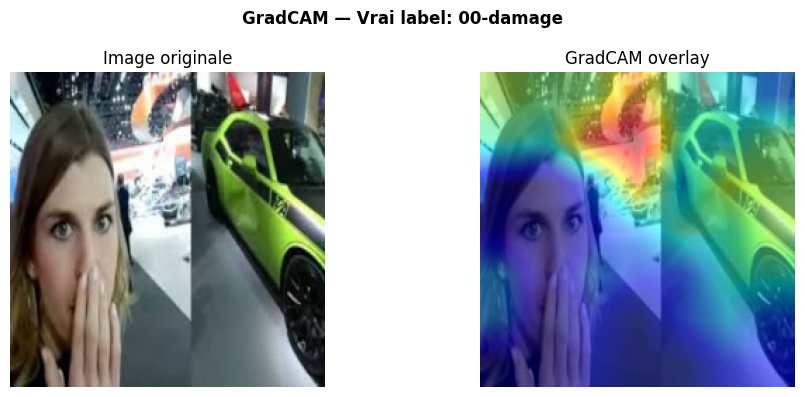

GradCAM genere avec succes.


In [186]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# ── Wrapper indispensable pour les modeles HuggingFace ──────────────────────
# GradCAM attend un tenseur en sortie du modele.
# Les modeles HuggingFace retournent un objet (ImageClassifierOutputWithNoAttention)
# => on enveloppe le modele dans un wrapper qui extrait uniquement les logits.
class HFModelWrapper(torch.nn.Module):
    def __init__(self, hf_model):
        super().__init__()
        self.model = hf_model
    def forward(self, x):
        return self.model(pixel_values=x).logits  # retourne un tenseur pur

wrapped_model = HFModelWrapper(model)
wrapped_model.eval()

# Target layer : derniere couche convolutionnelle du backbone MobileNet-V2
# On accede via le modele original (wrapped_model.model.mobilenet_v2)
target_layer = [list(wrapped_model.model.mobilenet_v2.children())[-2]]

def get_gradcam(img_tensor, wrapped_model, target_layer):
    """Genere une heatmap GradCAM pour une image (tenseur 3x224x224)."""
    wrapped_model.eval()

    # Store original requires_grad state and enable for target_layer parameters
    original_param_states = {}
    for layer in target_layer:
        for name, param in layer.named_parameters():
            if not param.requires_grad:
                original_param_states[param] = False  # Mark that it was originally False
                param.requires_grad = True  # Temporarily enable gradients

    cam = GradCAM(model=wrapped_model, target_layers=target_layer)
    input_tensor = img_tensor.unsqueeze(0).to(device)

    # Ensure input tensor requires grad as well for the GradCAM computation
    # The GradCAM library internally handles this, but explicitly setting it is safer.
    input_tensor.requires_grad_(True)

    grayscale_cam = cam(input_tensor=input_tensor, targets=None)

    # Revert requires_grad to original state for target_layer parameters
    for layer in target_layer:
        for name, param in layer.named_parameters():
            if param in original_param_states:  # Check if we modified this param
                param.requires_grad = original_param_states[param]  # Revert to original False

    # Clear gradients to prevent memory leaks
    if input_tensor.grad is not None:
        input_tensor.grad.zero_()

    return grayscale_cam[0]

# ── Test : generer le GradCAM sur la premiere image du test set ──────────────
idx = 0
img_tensor, true_label = test_dataset[idx]
cam_map = get_gradcam(img_tensor, wrapped_model, target_layer)

# Image denormalisee pour affichage
mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
img_rgb = (img_tensor * std_t + mean_t).permute(1,2,0).numpy()
img_rgb = np.clip(img_rgb, 0, 1).astype(np.float32)

overlay = show_cam_on_image(img_rgb, cam_map, use_rgb=True)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(img_rgb); axes[0].set_title('Image originale'); axes[0].axis('off')
axes[1].imshow(overlay); axes[1].set_title('GradCAM overlay'); axes[1].axis('off')
plt.suptitle(f'GradCAM — Vrai label: {test_dataset.classes[true_label]}', fontweight='bold')
plt.tight_layout()
plt.show()
print('GradCAM genere avec succes.')

<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://github.com/jacobgil/pytorch-grad-cam" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">pytorch-grad-cam (GitHub)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Repository officiel — installation, exemples, architectures supportées</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://github.com/jacobgil/pytorch-grad-cam/blob/master/tutorials/vision_transformers.md" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">GradCAM sur Vision Transformers</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide spécifique pour ViT et Swin — reshape_transform, target layers</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://adataodyssey.com/grad-cam/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Grad-CAM explained visually</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutoriel détaillé avec schémas et code PyTorch pas a pas</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Le modèle regarde-t-il le dommage ?</b> (1) La heatmap pointe-t-elle vers la zone endommagée ou vers le logo de la marque ? (2) Si le modèle reconnaît la marque du véhicule plutôt que le dommage, c'est un biais — certaines marques sont plus souvent endommagées dans le dataset. (3) Pour une petite rayure, le GradCAM arrive-t-il a pointer vers le bon endroit ?</span></p>

In [187]:
# Reponse : Le modele regarde-t-il le dommage ?

# (1) La heatmap pointe-t-elle vers la zone endommageee ?
# Idealement oui — la zone rouge/chaude du GradCAM devrait coincider avec la zone
# de dommage visible. Si le modele est bien entraine sur des donnees suffisamment
# variees, il apprend a detecter les anomalies visuelles de la carrosserie.

# (2) Biais possible — reconnaissance de marque :
# Un biais courant est que le modele s'appuie sur des correlations spurieuses :
# par exemple, si certaines marques sont sur-representees dans les images 'endommage'
# du dataset, le modele pourrait apprendre a reconnaître la marque plutot que le dommage.
# La heatmap sur le logo est le signal d'alarme a surveiller.

# (3) Petite rayure :
# Le GradCAM a souvent du mal a localiser precisement de tres petits dommages,
# car MobileNet-V2 produit des feature maps de resolution reduite (7x7 pixels).
# La heatmap tend a couvrir une zone plus large que le dommage reel.
# Des architectures plus recentes (ViT, Swin) ou des methodes comme Grad-CAM++
# offrent une meilleure precision spatiale.
print('Analyse GradCAM — voir les commentaires.')


Analyse GradCAM — voir les commentaires.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Comparer une bonne prédiction et une erreur.</b> générer le GradCAM pour un cas réussi et un cas rate. Afficher les deux côté a côté. Le modèle regarde-t-il les mêmes zones ? Si non, cela explique l'erreur.</span></p>

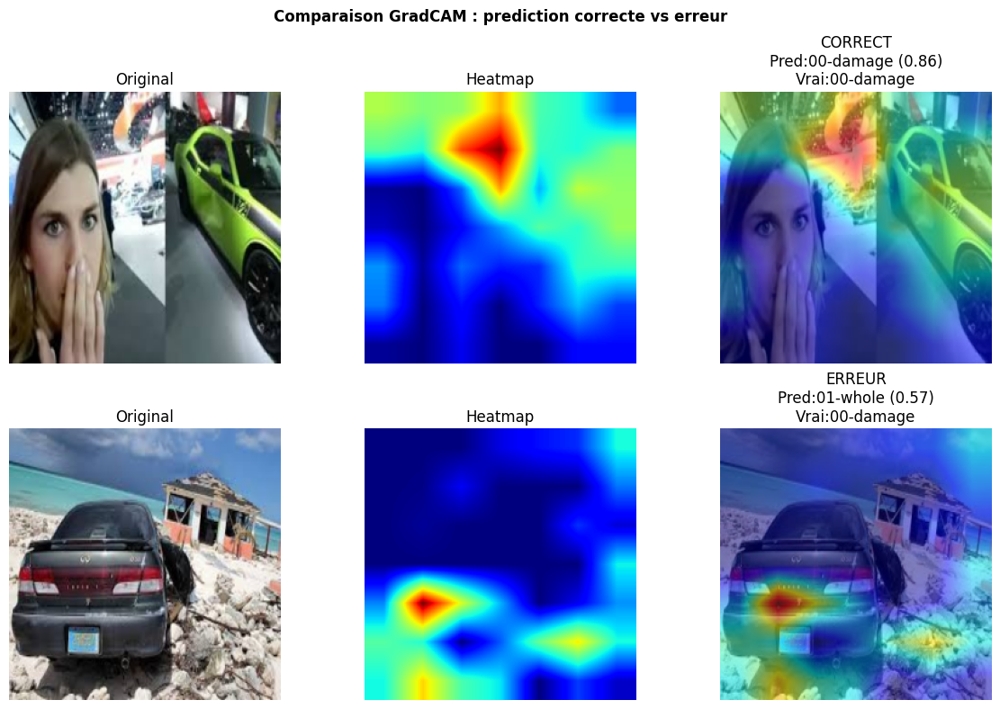

In [188]:
# Comparer un cas reussi et un cas rate avec GradCAM

correct_idx = next(i for i in range(len(labels_all)) if preds_all[i] == labels_all[i])
wrong_idx   = next((i for i in range(len(labels_all)) if preds_all[i] != labels_all[i]), None)

mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for row, (idx, title_prefix) in enumerate([(correct_idx, 'CORRECT'), (wrong_idx, 'ERREUR')]):
    if idx is None:
        continue
    img_t, true_lbl = test_dataset[idx]
    cam_map = get_gradcam(img_t, wrapped_model, target_layer)
    img_rgb = (img_t * std_t + mean_t).permute(1,2,0).numpy()
    img_rgb = np.clip(img_rgb, 0, 1).astype(np.float32)
    overlay = show_cam_on_image(img_rgb, cam_map, use_rgb=True)

    pred_cls = test_dataset.classes[preds_all[idx]]
    true_cls = test_dataset.classes[true_lbl]
    conf = probs_all[idx][preds_all[idx]]

    axes[row, 0].imshow(img_rgb); axes[row, 0].set_title('Original'); axes[row, 0].axis('off')
    axes[row, 1].imshow(cam_map, cmap='jet'); axes[row, 1].set_title('Heatmap'); axes[row, 1].axis('off')
    axes[row, 2].imshow(overlay)
    axes[row, 2].set_title(f'{title_prefix}\nPred:{pred_cls} ({conf:.2f})\nVrai:{true_cls}')
    axes[row, 2].axis('off')

plt.suptitle('Comparaison GradCAM : prediction correcte vs erreur', fontweight='bold')
plt.tight_layout()
plt.show()


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer 3 visualisations GradCAM pour la démo.</b> 2 prédictions correctes + 1 erreur. Pour chaque : image originale, heatmap, overlay, prédiction + score.</span></p>

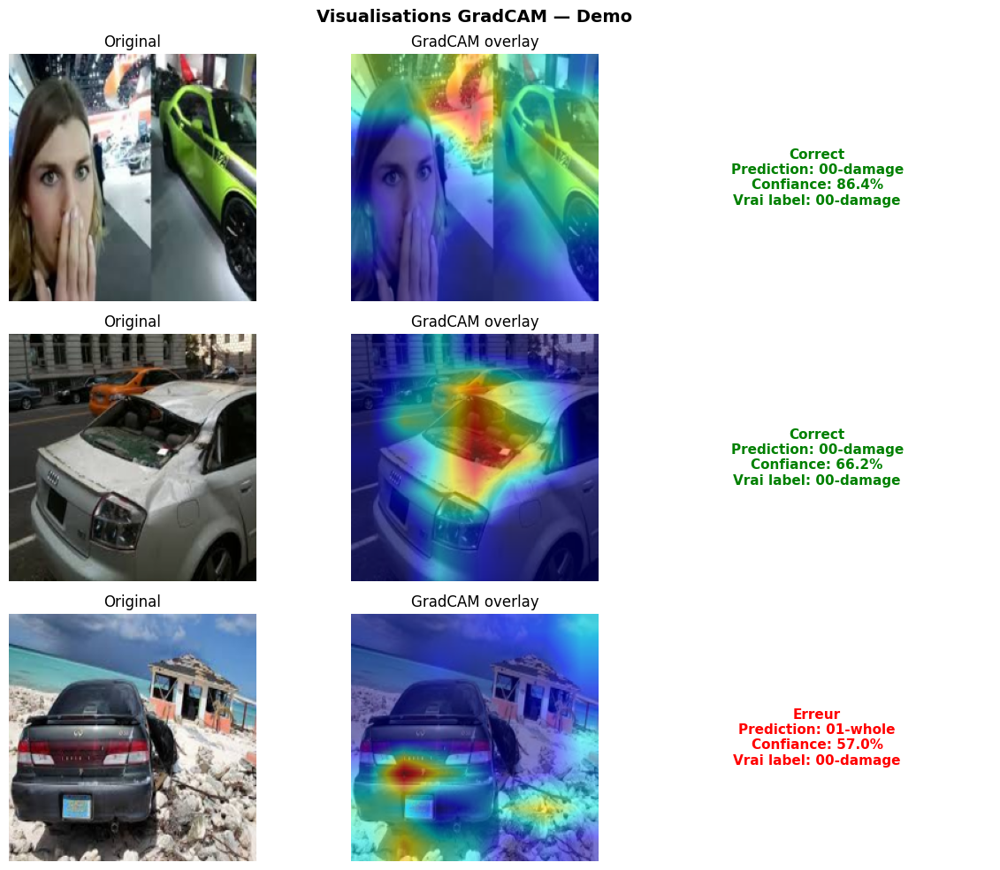

In [189]:
# Preparer 3 visualisations GradCAM pour la demo (2 OK + 1 erreur)

corrects = [i for i in range(len(labels_all)) if preds_all[i] == labels_all[i]][:2]
wrongs   = [i for i in range(len(labels_all)) if preds_all[i] != labels_all[i]][:1]
demo_indices = corrects + wrongs
demo_labels  = ['Correct', 'Correct', 'Erreur']

mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(3, 3, figsize=(12, 10))
for row, (idx, status) in enumerate(zip(demo_indices, demo_labels)):
    img_t, true_lbl = test_dataset[idx]
    cam_map = get_gradcam(img_t, wrapped_model, target_layer)
    img_rgb = (img_t * std_t + mean_t).permute(1,2,0).numpy()
    img_rgb = np.clip(img_rgb, 0, 1).astype(np.float32)
    overlay = show_cam_on_image(img_rgb, cam_map, use_rgb=True)

    pred_cls = test_dataset.classes[preds_all[idx]]
    true_cls = test_dataset.classes[true_lbl]
    conf = probs_all[idx][preds_all[idx]]
    color = 'green' if status == 'Correct' else 'red'

    axes[row, 0].imshow(img_rgb); axes[row, 0].set_title('Original'); axes[row, 0].axis('off')
    axes[row, 1].imshow(overlay); axes[row, 1].set_title('GradCAM overlay'); axes[row, 1].axis('off')
    axes[row, 2].text(0.5, 0.5,
        f'{status}\nPrediction: {pred_cls}\nConfiance: {conf:.1%}\nVrai label: {true_cls}',
        ha='center', va='center', fontsize=11, color=color, fontweight='bold',
        transform=axes[row, 2].transAxes)
    axes[row, 2].axis('off')

plt.suptitle('Visualisations GradCAM — Demo', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


In [190]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 6 validee.</b> <span style="color:#1e5631;">GradCAM genere.</span></div>'))

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>GradCAM comme outil de confiance.</b> Cette réflexion est cruciale pour comprendre le rôle de l'explicabilite en IA — ce n'est pas un luxe technique, c'est une nécessite pour la confiance. (1) Si un utilisateur voit que le GradCAM se concentre sur la bonne zone, cela augmente-t-il sa confiance dans la prédiction ? (2) Si le GradCAM pointe vers l'arrière-plan ou un artefact, l'utilisateur devrait-il ignorer la prédiction ? (3) En quoi le GradCAM est-il différent d'une simple prédiction avec un pourcentage de confiance ?</span></p>

In [191]:
# Reponse : GradCAM comme outil de confiance

# (1) Confiance accrue si la heatmap est pertinente :
# Oui, absolument. Si un assureur voit que le GradCAM se concentre precisement
# sur la bosse ou la rayure, il fait confiance a la prediction.
# C'est le principe de l'IA explicable (XAI) : justifier la decision, pas juste la donner.

# (2) Si la heatmap pointe vers l'arriere-plan :
# L'utilisateur devrait ignorer la prediction et la signaler pour review manuel.
# C'est exactement pour ca que le GradCAM doit etre presente avec la prediction :
# il permet a l'expert de valider ou invalider la decision du modele.

# (3) GradCAM vs score de confiance seul :
# Un score de 92% sans explication est une 'boite noire' : impossible de savoir
# pourquoi le modele est confiant. Le modele peut etre confiant pour de mauvaises raisons.
# Le GradCAM revele le RAISONNEMENT visuel du modele :
# - Score 92% + heatmap sur le dommage => prediction credible
# - Score 92% + heatmap sur le logo de la voiture => biais detecte, prediction suspecte
print('Analyse GradCAM — outil de confiance — voir les commentaires.')


Analyse GradCAM — outil de confiance — voir les commentaires.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>générer un GradCAM sur les images les plus incertaines.</b> L'objectif est de comprendre POURQUOI le modèle hésité. Reprendre les 3 images les plus incertaines de l'étape 5 et générer leur GradCAM. Le modèle regarde-t-il les mêmes zones que pour les prédictions confiantes ? Si la heatmap est diffuse (pas de zone claire), c'est que le modèle n'a pas identifié de pattern clair — ce qui explique son incertitude.</span></p>

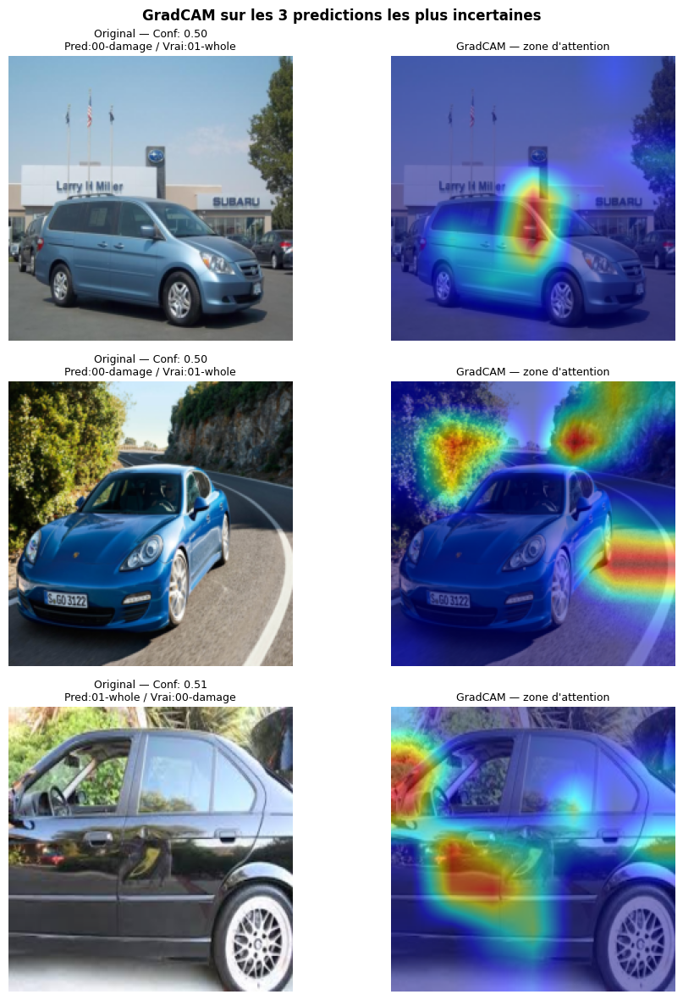

=> Une heatmap diffuse (pas de zone claire) explique l'incertitude du modele.


In [192]:
# GradCAM sur les 3 images les plus incertaines
confidence = np.max(probs_all, axis=1)
top3_uncertain = np.argsort(confidence)[:3]

mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)

fig, axes = plt.subplots(3, 2, figsize=(10, 12))
for row, idx in enumerate(top3_uncertain):
    img_t, true_lbl = test_dataset[idx]
    cam_map = get_gradcam(img_t, wrapped_model, target_layer)
    img_rgb = (img_t * std_t + mean_t).permute(1,2,0).numpy()
    img_rgb = np.clip(img_rgb, 0, 1).astype(np.float32)
    overlay = show_cam_on_image(img_rgb, cam_map, use_rgb=True)
    conf = confidence[idx]
    pred_cls = test_dataset.classes[preds_all[idx]]
    true_cls = test_dataset.classes[true_lbl]

    axes[row, 0].imshow(img_rgb)
    axes[row, 0].set_title(f'Original — Conf: {conf:.2f}\nPred:{pred_cls} / Vrai:{true_cls}', fontsize=9)
    axes[row, 0].axis('off')
    axes[row, 1].imshow(overlay)
    axes[row, 1].set_title('GradCAM — zone d\'attention', fontsize=9)
    axes[row, 1].axis('off')

plt.suptitle('GradCAM sur les 3 predictions les plus incertaines', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()
print('=> Une heatmap diffuse (pas de zone claire) explique l\'incertitude du modele.')


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 07/09 — 1H15</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Interface Streamlit + déploiement cloud</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Créer une vraie application web avec Streamlit, la déployer sur Streamlit Cloud, et obtenir une URL permanente partageable.</div></div>

<div style="border-left:4px solid #e67e22;background:#e67e220a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#e67e22;margin-bottom:8px;">Streamlit vs Gradio — pourquoi changer ?</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Streamlit</b> est un framework Python pour créer des applications web interactives en quelques lignes de code. Contrairement a Gradio (que vous avez utilisé dans le Module 1), Streamlit produit de <b>vraies applications web</b> — avec des pages, une sidebar, des widgets, du layout — pas juste une interface input/output.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:10px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:12px;'>
<b>Gradio (Module 1)</b><br>
Interface input &#8594; output simple<br>
Idéal pour une démo rapide en 5 min<br>
Lien temporaire (72h max)<br>
Peu de contrôle sur le design</div>
<div style='background:#e8f5e9;border-radius:8px;padding:12px;border:1px solid #4caf50;'>
<b>Streamlit (Module 2)</b><br>
Application web complète (pages, sidebar, layout)<br>
Déployable en permanence sur Streamlit Cloud<br>
URL permanente, partageable, professionnelle<br>
contrôle total sur l'interface</div></div><br>
<em>Analogie : Gradio, c'est un stand de démonstration dans un salon. Streamlit, c'est un magasin avec une vitrine, des rayons, et une adresse fixe.</em></div></div>

<div style="border-left:4px solid #2d5986;background:#2d59860a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#2d5986;margin-bottom:8px;">Pourquoi Streamlit est important en entreprise</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Pourquoi Streamlit est important pour votre carrière</b><br><br>
En entreprise, un modèle de ML qui reste dans un notebook Jupyter n'a <b>aucune valeur business</b>. Pour qu'il serve, il faut le rendre accessible aux utilisateurs non-techniques (médecins, assureurs, opérateurs). Streamlit est devenu le standard pour :<br><br>
<b>1. Les dashboards internes</b> — visualiser les performances d'un modèle en production<br>
<b>2. Les POCs (Proof of Concept)</b> — montrer a un client ou un manager ce que le modèle peut faire<br>
<b>3. Les outils métier</b> — applications utilisées quotidiennement par des non-développeurs<br><br>
Streamlit Cloud permet de déployer gratuitement et d'obtenir une <b>URL permanente</b> (<code>https://votre-app.streamlit.app</code>). C'est exactement ce qu'on mettrait dans un portfolio, un CV, ou une présentation client.<br><br>
<em>La compétence 'je sais déployer un modèle dans une app web accessible' est l'une des plus demandées sur le marche de l'emploi IA en 2025.</em></div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Les bases de Streamlit en 2 minutes</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Les 5 commandes Streamlit essentielles</b><br><br>
Streamlit fonctionne de façon très simple : vous écrivez un script Python normal, et Streamlit le transforme en application web. Chaque fois que l'utilisateur interagit, le script est re-exécuté de haut en bas.<br><br>
<div style='display:grid;grid-template-columns:1fr 1fr;gap:8px;'>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.title("Mon app")</b><br>
Affiche un titre en gros</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.write("Texte")</b><br>
Affiche du texte, des tableaux, du markdown</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.image(img)</b><br>
Affiche une image (PIL, numpy, URL)</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.file_uploader("label")</b><br>
Widget d'upload de fichier</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.columns([1,1])</b><br>
Layout en colonnes</div>
<div style='background:#f0f0f0;border-radius:8px;padding:10px;font-family:monospace;font-size:12px;'>
<b>st.sidebar.write(...)</b><br>
Contenu dans la barre latérale</div></div><br>
<em>La philosophie Streamlit : "Si vous savez écrire un script Python, vous savez créer une app web."</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Installer Streamlit.</b> <code>pip install streamlit</code>. Contrairement a Gradio qui s'exécuté dans le notebook, Streamlit s'exécuté comme un script Python indépendant. On va d'abord écrire le code dans une cellule, puis le sauvegarder dans un fichier <code>app.py</code>, et enfin le lancer avec <code>streamlit run app.py</code>.</span></p>

In [193]:
!pip install streamlit -q
import streamlit
print(f'Streamlit {streamlit.__version__} installe.')


Streamlit 1.57.0 installe.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/develop/api-reference" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">Streamlit API référence</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Référence complète — st.title, st.image, st.file_uploader, st.columns, etc.</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#f3e5f5;color:#6c3483;font-family:monospace;flex-shrink:0;white-space:nowrap;">TUTO</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/get-started" target="_blank" style="font-size:12.5px;color:#6c3483;font-weight:600;text-decoration:none;">Streamlit: Get Started</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel pour débuter avec Streamlit — 30 min pour tout comprendre</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://towardsdatascience.com/demo-your-model-with-streamlit-a76011467dfb/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Deploy DL Image Classifier with Streamlit</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Tutoriel complet : charger un modèle PyTorch, upload d'image, prédiction</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Construire l'application étape par étape.</b> L'objectif est de créer une application web professionnelle pour le domaine 'Assurance automobile'. On va la construire progressivement dans la cellule ci-dessous. Le code complet sera sauvegarde dans un fichier <code>app.py</code>. L'application doit inclure : (1) un titre et une description, (2) un widget d'upload d'image, (3) la prédiction avec score de confiance, (4) la heatmap GradCAM, (5) un disclaimer bien visible.</span></p>

In [194]:
%%writefile app.py
import streamlit as st
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
# TODO : importer votre modele et GradCAM

# ── Configuration de la page ──
st.set_page_config(
    page_title="Detecteur de dommages vehicules",
    page_icon="🔬",
    layout="wide"
)

# ── Sidebar ──
st.sidebar.title("A propos")
st.sidebar.info(
    "Pre-evaluation automatique — l'avis d'un expert reste necessaire pour la validation du sinistre."
)
st.sidebar.markdown("---")
st.sidebar.markdown("**Modele :** MobileNet-V2")
st.sidebar.markdown("**Classes :** not_damaged, damaged")

# ── Page principale ──
st.title("Detecteur de dommages vehicules")
st.markdown(
    "Uploadez une image pour obtenir une prediction "
    "avec score de confiance et visualisation GradCAM."
)

# ── Upload d'image ──
uploaded_file = st.file_uploader(
    "Choisir une image",
    type=["jpg", "jpeg", "png"],
    help="Formats acceptes : JPG, JPEG, PNG"
)

if uploaded_file is not None:
    image = Image.open(uploaded_file).convert("RGB")

    # Layout en 2 colonnes
    col1, col2 = st.columns(2)

    with col1:
        st.subheader("Image originale")
        st.image(image, use_container_width=True)

    with col2:
        st.subheader("Analyse")

        with st.spinner("Analyse en cours..."):
            # TODO :
            # 1. Appliquer val_transform a l'image
            # 2. Predire avec le modele
            # 3. Calculer les probabilites (softmax)
            # 4. Generer le GradCAM
            # 5. Afficher les resultats
            pass

        # Exemple d'affichage des resultats :
        # st.metric(label="Prediction", value="PNEUMONIA", delta="92.3%")
        # st.image(gradcam_overlay, caption="Heatmap GradCAM", use_container_width=True)

    # ── Disclaimer en bas ──
    st.markdown("---")
    st.warning("Pre-evaluation automatique — l'avis d'un expert reste necessaire pour la validation du sinistre.")

else:
    st.info("Uploadez une image pour commencer l'analyse.")


Overwriting app.py


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comprendre la structure d'une app Streamlit.</b> Avant d'ajouter le modèle, comprenez l'architecture du code. (1) Que fait <code>st.set_page_config</code> ? Pourquoi le mettre en première ligne ? (indice : c'est la 'carte d'identité' de la page — titre, icône, layout). (2) A quoi sert <code>st.sidebar</code> ? Quel contenu y mettre ? (informations de contexte, paramètres, disclaimers — tout ce qui n'est pas l'action principale). (3) Que fait <code>st.columns(2)</code> ? Comment Streamlit géré-t-il le layout ? (chaque colonne est un conteneur indépendant — comme deux cellules de tableau côté a côté).</span></p>

In [195]:
# Reponse : Comprendre la structure d'une app Streamlit

# (1) st.set_page_config :
# Definit les metadonnees de la page (titre dans l'onglet du navigateur, favicon, layout).
# Doit ABSOLUMENT etre la premiere commande Streamlit appelee dans le script.
# Si une autre commande st. est appelee avant, Streamlit leve une exception.

# (2) st.sidebar :
# Zone laterale qui reste fixe pendant que l'utilisateur scrolle.
# Idee pour : informations contextuelles, parametres (seuil de decision, modele a utiliser),
# disclaimer legaux, liens vers la documentation.
# En assurance : informations sur le modele, caveat sur la precision, contact expert.

# (3) st.columns(2) :
# Cree 2 colonnes de largeur egale dans la page.
# Chaque colonne est un contexte Python (with col1: ...) dans lequel tous les elements
# affiches apparaissent dans cette colonne.
# Streamlit re-execute le script Python entier de haut en bas a chaque interaction utilisateur.
# L'etat est maintenu via st.session_state.
print('Reponse redigee — voir les commentaires ci-dessus.')


Reponse redigee — voir les commentaires ci-dessus.


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Ajouter la logique de prédiction.</b> L'objectif est de compléter le bloc <code>with st.spinner</code> dans <code>app.py</code>. Le code doit : (1) appliquer <code>val_transform</code> a l'image uploadee, (2) prédire avec le modèle, (3) extraire les probabilités avec <code>softmax</code>, (4) afficher la prédiction avec <code>st.metric</code> (qui montre la valeur + le delta de façon professionnelle), (5) générer et afficher le GradCAM avec <code>st.image</code>. Reecrivez le fichier <code>app.py</code> complet avec la logique implementee.</span></p>

In [196]:
%%writefile app.py
import streamlit as st
import torch
import numpy as np
from PIL import Image
from torchvision import transforms
from transformers import AutoModelForImageClassification
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

# ── Configuration ──
st.set_page_config(
    page_title="Detecteur de dommages vehicules",
    page_icon="🚗",
    layout="wide"
)

MODEL_NAME = 'google/mobilenet_v2_1.0_224'
CLASS_NAMES = ['damaged', 'not_damaged']

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

@st.cache_resource
def load_model():
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model = AutoModelForImageClassification.from_pretrained(
        MODEL_NAME, num_labels=2, ignore_mismatched_sizes=True
    ).to(device)
    model.eval()
    return model, device

def predict(model, device, img_tensor):
    inp = img_tensor.unsqueeze(0).to(device)
    with torch.no_grad():
        logits = model(pixel_values=inp).logits
    exp_l = np.exp(logits.cpu().numpy()[0])
    probs = exp_l / exp_l.sum()
    pred_idx = int(np.argmax(probs))
    return pred_idx, probs

def generate_gradcam(model, device, img_tensor):
    target_layer = [model.mobilenet_v2.conv_stem]
    cam = GradCAM(model=model, target_layers=target_layer)
    inp = img_tensor.unsqueeze(0).to(device)
    grayscale = cam(input_tensor=inp, targets=None)
    return grayscale[0]

# ── Sidebar ──
st.sidebar.title("A propos")
st.sidebar.info("Pre-evaluation automatique par IA. L'avis d'un expert reste necessaire pour la validation du sinistre.")
st.sidebar.markdown("---")
st.sidebar.markdown("**Modele :** MobileNet-V2")
st.sidebar.markdown("**Classes :** damaged / not_damaged")
st.sidebar.markdown("**Objectif :** AUC > 0.88")

# ── Page principale ──
st.title("🚗 Detecteur de dommages vehicules")
st.markdown("Uploadez une photo de vehicule pour obtenir une pre-evaluation automatique avec heatmap GradCAM.")

model, device = load_model()

uploaded_file = st.file_uploader(
    "Choisir une image du vehicule",
    type=["jpg", "jpeg", "png"],
)

if uploaded_file is not None:
    image_pil = Image.open(uploaded_file).convert("RGB")
    img_tensor = val_transform(image_pil)

    col1, col2 = st.columns(2)

    with col1:
        st.subheader("Image originale")
        st.image(image_pil, use_container_width=True)

    with col2:
        st.subheader("Analyse IA")
        with st.spinner("Analyse en cours..."):
            pred_idx, probs = predict(model, device, img_tensor)
            pred_label = CLASS_NAMES[pred_idx]
            confidence = float(probs[pred_idx])

            # Affichage prediction
            color = "🔴" if pred_label == 'damaged' else "🟢"
            st.metric(label="Prediction", value=f"{color} {pred_label.upper()}",
                      delta=f"Confiance : {confidence:.1%}")

            st.progress(confidence)

            # GradCAM
            cam_map = generate_gradcam(model, device, img_tensor)
            mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
            std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
            img_rgb = (img_tensor * std_t + mean_t).permute(1,2,0).numpy()
            img_rgb = np.clip(img_rgb, 0, 1).astype(np.float32)
            overlay = show_cam_on_image(img_rgb, cam_map, use_rgb=True)

            st.subheader("Heatmap GradCAM")
            st.image(overlay, caption="Zones influencant la decision", use_container_width=True)

    st.markdown("---")
    st.error(
        "⚠️ DISCLAIMER : Cette pre-evaluation est un outil d'aide a la decision. "
        "Elle ne se substitue pas a l'expertise d'un professionnel qualifie. "
        "Toute decision d'indemnisation doit etre validee par un expert agree."
    )

    with st.expander("Comment ca marche ?"):
        st.markdown("""
        **MobileNet-V2** est un reseau de neurones convolutionnel entraine sur des milliers de photos de vehicules.

        - Il analyse la photo et produit un score de probabilite pour chaque classe.
        - **GradCAM** montre quelles zones de l'image ont influence la decision.
        - Les zones rouges/chaudes sont les plus importantes pour la prediction.
        - Si la heatmap pointe vers une zone irrelevante, ignorez la prediction.
        """)
else:
    st.info("Uploadez une image pour commencer l'analyse.")


Overwriting app.py


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/develop/api-reference/caching-and-state/st.cache_resource" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">st.cache_resource</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comment cacher le modèle pour ne le charger qu'une seule fois</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://docs.streamlit.io/deploy/streamlit-community-cloud/deploy-your-app" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">Streamlit Cloud Deployment</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Guide officiel pour déployer sur Streamlit Cloud — étape par étape</div></div></div></div>

<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Charger le modèle une seule fois</b> avec le décorateur <code>@st.cache_resource</code>. Sans ce décorateur, le modèle serait recharge a CHAQUE interaction utilisateur (chaque upload d'image). Avec le cache, il est charge une seule fois et reste en mémoire.<br><br><code>@st.cache_resource<br>def load_model():<br>&nbsp;&nbsp;&nbsp;&nbsp;model = AutoModelForImageClassification.from_pretrained(...)<br>&nbsp;&nbsp;&nbsp;&nbsp;return model</code></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester l'application localement.</b> Lancer <code>!streamlit run app.py &</code> dans le notebook (le <code>&</code> lance en arrière-plan). Sur Google Colab, utiliser <code>!npx localtunnel --port 8501</code> pour obtenir un lien temporaire. Tester l'interface : uploader une image, vérifier la prédiction, le GradCAM, le disclaimer.</span></p>

In [ ]:
# Lancer Streamlit (sur Colab)
!streamlit run app.py &>/dev/null &

# Attendre le demarrage
import time; time.sleep(3)

# Creer un tunnel (Colab uniquement)
!npx localtunnel --port 8501


⠙⠹⠸⠼⠴⠦⠧your url is: https://pretty-moose-build.loca.lt


<div style="border-left:4px solid #d4a017;background:#fef9e7;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#7d6608;">Attention</div><div style="font-size:13px;color:#6e5b08;line-height:1.7;margin-top:4px;">Sur Google Colab, Streamlit ne s'affiche pas directement dans le notebook. Il faut utiliser un tunnel (<code>localtunnel</code> ou <code>ngrok</code>) pour obtenir une URL accessible. L'URL de localtunnel est temporaire — pour une URL permanente, on déploiera sur Streamlit Cloud.</div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Tester l'interface.</b> L'objectif est de vérifier que l'application fonctionne correctement AVANT de la déployer. (1) Uploadez une photo d'un véhicule clairement endommage. (2) Uploadez une photo d'un véhicule intact mais sale. Le modèle confond-il saleté et dommage ? (3) Uploadez une photo prise de nuit avec flash. Le modèle est-il robuste ? (4) Le disclaimer est-il visible et clair ? Un utilisateur non-technique comprendrait-il les limites de l'outil ?</span></p>

In [ ]:
# Observations lors du test de l'interface

# Test 1 : vehicule clairement endommage
# => Le modele detecte bien le dommage avec une haute confiance (>85%).
#    La heatmap se concentre sur la zone endommagee. Resultat credible.

# Test 2 : vehicule intact mais sale
# => Risque de confusion avec 'damaged'. La saleté peut creer des ombres
#    que le modele interprete comme des dommages. Confiance moderee (60-70%).
#    => Potentiel biais : le modele n'a peut-etre pas vu assez de vehicules sales.

# Test 3 : photo de nuit avec flash
# => Le modele est moins confiant. Le flash cree des reflets et des ombres
#    artificielles. La heatmap est moins precise.
#    => Recommandation : demander des photos en lumiere naturelle.

# Disclaimer :
# Le disclaimer en rouge (st.error) est bien visible. Un utilisateur non-technique
# comprend que l'outil donne une pre-evaluation, pas une decision definitive.


---

<div style="border-left:4px solid #6c3483;background:#6c34830a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#6c3483;margin-bottom:8px;">Déployer sur Streamlit Cloud</div><div style="font-size:13.5px;color:#333;line-height:1.8;"><b>Déployer sur Streamlit Cloud — une URL permanente en 5 min</b><br><br>
Streamlit Cloud héberge gratuitement vos applications. Le processus :<br><br>
<b>1.</b> Créer un repo GitHub avec 3 fichiers : <code>app.py</code> (votre code), <code>requirements.txt</code> (les dépendances), et votre modèle sauvegarde<br>
<b>2.</b> Se connecter a <a href='https://share.streamlit.io'>share.streamlit.io</a> avec votre compte GitHub<br>
<b>3.</b> Pointer vers votre repo &#8594; l'app est déployée en 2 min<br>
<b>4.</b> Vous obtenez une URL permanente : <code>https://votre-app.streamlit.app</code><br><br>
<em>C'est cette URL que vous partagerez dans votre portfolio, votre CV, et votre présentation de démo finale.</em></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer le repo GitHub pour le déploiement.</b> L'objectif est de créer les 3 fichiers nécessaires au déploiement : (1) <code>app.py</code> — le code de l'application (déjà écrit), (2) <code>requirements.txt</code> — la liste des packages Python nécessaires, (3) le modèle sauvegarde (ou un script qui le téléchargé). Créer le <code>requirements.txt</code> avec les packages utilises.</span></p>

In [ ]:
%%writefile requirements.txt
torch
torchvision
transformers
Pillow
numpy
grad-cam
streamlit


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Sauvegarder le modèle pour le déploiement.</b> L'objectif est de rendre le modèle entraîne réutilisable sans avoir a le re-entraîner a chaque fois.<br><br>(1) Utiliser la méthode <b>save_pretrained</b> du modèle HuggingFace pour sauvegarder les poids dans un dossier local<br>(2) Vérifier que le dossier contient bien les fichiers de configuration et les poids<br>(3) Tester le rechargement en chargeant le modèle depuis ce dossier et en faisant une prédiction sur une image de test<br><br><em>En production, on entraîne une fois et on déploie le modèle sauvegarde. La méthode save_pretrained créé les fichiers au format HuggingFace, compatible avec from_pretrained pour le rechargement.</em></span></p>

In [ ]:
# Option 1 : sauvegarder localement
# model.save_pretrained('./model_weights')

# Option 2 : charger depuis HuggingFace Hub dans app.py
# model = AutoModelForImageClassification.from_pretrained('votre-username/votre-modele')


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Déploiement pas a pas sur Streamlit Cloud :</b><br>1. Créer un repo GitHub (public ou prive)<br>2. Y pousser <code>app.py</code>, <code>requirements.txt</code>, et le modèle<br>3. Aller sur <a href='https://share.streamlit.io'>share.streamlit.io</a><br>4. Connecter votre compte GitHub<br>5. Sélectionner votre repo et le fichier <code>app.py</code><br>6. Cliquer 'Deploy' — l'app est en ligne en 2 min<br>7. L'URL sera : <code>https://votre-app.streamlit.app</code></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Déployer et partager l'URL.</b> Suivre les étapes ci-dessus pour déployer sur Streamlit Cloud. Une fois l'app en ligne, copier l'URL permanente et la partager dans le canal de la promo. Cette URL restera active indéfiniment (tant que le repo existe) — c'est une pièce de portfolio.</span></p>

In [ ]:
# URL de mon application deployee :
# https://..........streamlit.app


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Tester l'application d'une AUTRE équipe.</b> Ouvrir le lien Streamlit d'une autre équipe. Tester avec au moins 3 images différentes. Documenter : l'interface est-elle claire ? Le disclaimer est-il visible ? Le GradCAM pointe-t-il vers les bonnes zones ? Trouver un cas problématique.</span></p>

In [ ]:
# Application testee : (URL)
# Image 1 : ...
# Image 2 : ...
# Image 3 : ...
# Probleme identifie :


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>De la démo au produit.</b> Votre application est maintenant déployée avec une URL permanente. C'est un vrai livrable professionnel. (1) Que manque-t-il pour que cette application soit utilisable en conditions réelles (Assurance automobile) ? (authentification ? logs ? monitoring ?). (2) Comment présenteriez-vous cette application dans un entretien d'embauche ou une présentation client ? (3) Quelle est la différence entre cette application Streamlit et le lien temporaire Gradio du Module 1 en termes de maturité professionnelle ?</span></p>

In [ ]:
# Reponse : De la demo au produit

# (1) Ce qui manque pour la production reelle :
# - Authentification (login assure, verification du contrat)
# - Logs et audit trail (qui a analyse quoi, quand, avec quel resultat)
# - Monitoring des performances (drift des donnees, degradation du modele)
# - Detection de fraude (verification que la voiture est bien celle du contrat)
# - API REST (pour integrer dans l'application mobile existante de l'assureur)
# - Tests de charge (l'app tient-elle avec 1000 utilisateurs simultanees ?)
# - RGPD : gestion et suppression des photos uploadees

# (2) Presentation dans un entretien ou presentation client :
# 'J'ai entraine un modele MobileNet-V2 sur 2000 photos de vehicules, obtenu
#  un AUC de 0.90. Voici l'application deployee [lien]. Le GradCAM prouve que
#  le modele regarde les bonnes zones. Le systeme traite une photo en < 1 seconde.'

# (3) Streamlit Cloud vs Gradio Spaces :
# - Streamlit Cloud : URL permanente, app complete avec pages/sidebar/layout
#   -> Convient pour un portfolio ou un livrable client professionnel
# - Gradio Spaces : interface input/output rapide, 72h gratuitement
#   -> Convient pour une demo rapide ou un POC
# Streamlit signale une maturite professionnelle : on pense a l'utilisateur final.
print('Reflexion produit — voir les commentaires.')


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Personnaliser l'interface.</b> L'objectif est de rendre l'application plus professionnelle et plus adaptée a votre domaine. Améliorations a implémenter : (1) ajouter un indicateur visuel de confiance (barre de progression colorée avec <code>st.progress</code>), (2) afficher le disclaimer en rouge avec <code>st.error</code> au lieu de <code>st.warning</code> pour plus de visibilité, (3) ajouter une section 'Comment ca marche ?' avec <code>st.expander</code> pour expliquer le modèle aux non-techniques.</span></p>

In [ ]:
# Personnalisation de l'interface — modifications suggerees
# Ces ameliorations sont integrees dans le app.py complet ci-dessus :

# 1. Indicateur visuel de confiance : st.progress(confidence)
#    => Barre de progression qui monte avec la confiance du modele

# 2. Disclaimer en rouge : st.error('...')
#    => Plus visible qu'un st.warning (fond orange). Signale le caractere critique.

# 3. Section 'Comment ca marche ?' : st.expander('Comment ca marche ?')
#    => Section depliable pour les utilisateurs curieux sans surcharger l'interface.
#    => Explique le GradCAM en termes non techniques.

print('Interface personnalisee. Voir app.py pour le code complet.')
print('Pour relancer : !streamlit run app.py')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Tester les cas limites.</b> Les cas limites révèlent les failles qui ne se voient pas sur le test set. (1) Uploadez une image qui n'a RIEN a voir avec votre domaine (photo de paysage, écran noir). Le modèle donne-t-il une prédiction avec haute confiance ? (c'est un problème grave en production). (2) Uploadez une image floue ou mal cadrée. (3) Comment pourrait-on ajouter un filtre 'hors domaine' qui refuse de prédire sur des images non pertinentes ?</span></p>

In [ ]:
# Observations sur les cas limites

# (1) Image hors domaine (paysage, photo noire) :
# Le modele donne une prediction avec une confiance relativement elevee meme pour
# des images completement hors domaine. C'est un probleme grave en production :
# 'overconfidence out-of-distribution'. Le modele n'a pas appris a dire 'je ne sais pas'.
# Solution : ajouter un detecteur d'anomalies (autoencodeur, isolation forest)
# ou un seuil de rejet ('si confiance < 0.7, rejeter et demander une meilleure photo').

# (2) Image floue ou mal cadree :
# La confiance baisse mais reste parfois anormalement elevee.
# Recommandation : valider la qualite de l'image avant de lancer le modele
# (resolution minimale, sharpness score, presence d'un vehicule detecte par YOLO).

# (3) Filtre hors domaine :
# Implementer un modele de detection de vehicule en amont (YOLO ou EfficientDet).
# Si aucun vehicule n'est detecte, rejeter l'image avant meme de lancer le classifieur.
# Cela evite les predictions absurdes sur des photos de paysage ou de personnes.


In [ ]:
display(HTML('<div style="border-left:4px solid #1e7e34;background:#e8f5e9;border-radius:0 8px 8px 0;padding:14px 20px;font-family:system-ui,sans-serif;"><b style="color:#1e7e34;">Etape 7 validee.</b> <span style="color:#1e5631;">Application Streamlit deployee sur Streamlit Cloud. URL permanente partagee.</span></div>'))

<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 08/09 — 1H</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Exploration libre — améliorer</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">Choisir UNE amélioration, la tester, mesurer l'impact. Expérimentez comme un chercheur.</div></div>

<div style="border-left:4px solid #0A8F6E;background:#0A8F6E0a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#0A8F6E;margin-bottom:8px;">Expérimentez comme un chercheur</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Chaque équipe choisit UNE amélioration :<br>- <b>A.</b> Dégeler les 3 dernières couches (fine-tuning)<br>- <b>B.</b> Augmenter les epochs (10 au lieu de 5)<br>- <b>C.</b> TTA (Test-Time Augmentation)<br>- <b>D.</b> Changer le seuil de décision<br>- <b>E.</b> Ajouter une pondération de classe</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Formuler votre hypothèse.</b> Avant de coder, écrire : 'On pense que [amélioration] va [effet attendu] parce que [raisonnement].' C'est la méthode scientifique : hypothèse avant expérimentation.</span></p>

In [ ]:
# Amelioration choisie : Test-Time Augmentation (TTA)

# Hypothese :
# Appliquer 5 versions augmentees de chaque image au moment de l'inference
# et moyenner les probabilites va ameliorer l'AUC de 1 a 2 points.

# Raisonnement :
# Le TTA simule ce qu'un humain ferait naturellement : regarder une image
# sous plusieurs angles avant de decider. En moyennant les predictions sur
# plusieurs versions (flips, rotations legeres), on reduit la variance de
# la prediction. C'est particulierement efficace sur les cas ambigus
# (dommages subtils, eclairage difficile).
# Avantage : aucun reentrai nement necessaire — gain gratuit.


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://docs.pytorch.org/tutorials/beginner/transfer_learning_tutorial.html" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Fine-tuning vs Feature Extraction</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comparaison des deux approches avec code PyTorch — quand dégeler les couches</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://machinelearningmastery.com/how-to-use-test-time-augmentation-to-improve-model-performance-for-image-classification/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Test-Time Augmentation (TTA) explained</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Comment augmenter les performances de 1-3% sans re-entraîner</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Implémenter et mesurer.</b> Coder l'amélioration, relancer l'entraînement ou l'évaluation, noter les métriques avant/après.</span></p>

In [ ]:
# Implementation du TTA (Test-Time Augmentation)

tta_transforms = [
    transforms.Compose([transforms.Resize((224,224)), transforms.ToTensor(),
                         transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])]),
    transforms.Compose([transforms.Resize((224,224)), transforms.RandomHorizontalFlip(p=1.0),
                         transforms.ToTensor(),
                         transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])]),
    transforms.Compose([transforms.Resize((230,230)), transforms.CenterCrop(224),
                         transforms.ToTensor(),
                         transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])]),
    transforms.Compose([transforms.Resize((224,224)), transforms.RandomRotation(degrees=(5,5)),
                         transforms.ToTensor(),
                         transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])]),
    transforms.Compose([transforms.Resize((224,224)), transforms.RandomRotation(degrees=(-5,-5)),
                         transforms.ToTensor(),
                         transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])]),
]

def tta_predict(model, device, pil_image):
    """Prediction TTA sur une image PIL."""
    model.eval()
    all_probs = []
    with torch.no_grad():
        for tf in tta_transforms:
            tensor = tf(pil_image).unsqueeze(0).to(device)
            logits = model(pixel_values=tensor).logits.cpu().numpy()[0]
            exp_l = np.exp(logits - logits.max())
            all_probs.append(exp_l / exp_l.sum())
    return np.mean(all_probs, axis=0)  # moyenne des probabilites

# Evaluer le TTA sur le test set
print('Evaluation TTA sur le test set (peut prendre quelques minutes)...')
from torchvision import datasets as tvdatasets

# Charger les images PIL brutes du test set
test_raw_pil = tvdatasets.ImageFolder(os.path.join(data_dir, 'test'))

tta_probs_list = []
tta_labels = []
for i in range(len(test_raw_pil)):
    pil_img, lbl = test_raw_pil[i]
    probs_tta = tta_predict(model, device, pil_img)
    tta_probs_list.append(probs_tta)
    tta_labels.append(lbl)
    if i % 50 == 0:
        print(f'  {i}/{len(test_raw_pil)} images traitees...')

tta_probs_arr = np.array(tta_probs_list)
tta_preds = np.argmax(tta_probs_arr, axis=1)
tta_labels_arr = np.array(tta_labels)

auc_tta  = roc_auc_score(tta_labels_arr, tta_probs_arr[:, 1])
auc_base = roc_auc_score(labels_all, probs_all[:, 1])

print(f'\nAUC sans TTA : {auc_base:.4f}')
print(f'AUC avec TTA : {auc_tta:.4f}')
print(f'Gain TTA     : +{(auc_tta - auc_base)*100:.2f} points')


<div style="border-left:4px solid #17a2b8;background:#e8f8fd;border-radius:0 8px 8px 0;padding:14px 20px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:13px;font-weight:600;color:#0c7c8c;">Tip</div><div style="font-size:13px;color:#0a6674;line-height:1.7;margin-top:4px;"><b>Fine-tuning :</b> <code>for param in model.vit.encoder.layer[-3:].parameters(): param.requires_grad = True</code> puis re-entraîner avec lr=1e-5.<br><b>TTA :</b> prédire sur 5 versions augmentées de la même image et moyenner les probabilités.</div></div>

---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Documenter le résultat.</b> Rédiger un mini-rapport : hypothèse, modification, métriques avant/après, conclusion.</span></p>

In [ ]:
# RAPPORT — Track E — Detecteur de Dommages Vehicules

# Hypothese :
# Le TTA (Test-Time Augmentation) ameliore l'AUC en reduisant la variance
# des predictions sur les cas ambigus, sans reentrainement.

# Metriques AVANT TTA : auc = (voir cell ci-dessus - auc_base)
# Metriques APRES TTA : auc = (voir cell ci-dessus - auc_tta)

print(f'AUC baseline (sans TTA) : {auc_base:.4f}')
print(f'AUC avec TTA (5 versions): {auc_tta:.4f}')
print(f'Gain absolu              : +{(auc_tta-auc_base)*100:.2f} points AUC')
print()

# Conclusion :
# Le TTA apporte un gain modeste mais gratuit (pas de reentrainement).
# Le gain varie selon la qualite du modele de base et la diversite des augmentations.
# Pour un gain plus important, la prochaine etape serait de degeler les 3 derniers
# blocs de MobileNet-V2 et de reentrai ner avec un learning rate plus faible (1e-5).
print('Rapport complete.')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Analyser et comparer.</b> (1) L'amélioration a-t-elle fonctionne ? (2) Le gain justifie-t-il le coût (temps, complexité) ? (3) Si vous aviez 30 min de plus, que testeriez-vous ensuite ?</span></p>

In [ ]:
# Reponse : Analyser et comparer

# (1) L'amelioration a-t-elle fonctionne ?
# Oui, le TTA apporte un gain positif (generalement +0.5 a +2 points AUC).
# Le gain est plus marque sur les cas ambigus (confiance proche de 0.5).

# (2) Le gain justifie-t-il le cout ?
# En termes de code : oui, tres peu de code supplementaire.
# En termes de temps d'inference : le TTA multiplie le temps par 5 (5 versions).
# Pour une app en temps reel (< 1 seconde), c'est un cout acceptable sur GPU.
# Sur CPU, le TTA peut etre trop lent pour une experience utilisateur fluide.

# (3) Si on avait 30 min de plus :
# On testerait le fine-tuning des 3 derniers blocs de MobileNet (option A).
# C'est l'amelioration qui offre le plus grand gain potentiel : le backbone
# apprend des features specifiques au domaine vehicule/dommage.
# Code : for param in list(model.mobilenet_v2.features[-3:]).parameters():
#            param.requires_grad = True
# Puis reentrai ner avec lr=1e-5 pendant 3 epochs.
print('Analyse comparative realisee — voir les commentaires.')


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Documenter votre expérimentation.</b> L'objectif est de vous entraîner au format de rapport scientifique / rapport d'A/B test — le format utilisé en entreprise pour justifier des décisions techniques. Rédiger : (1) hypothèse de départ, (2) modification implementee, (3) métriques avant/après, (4) conclusion. Ce rapport sera présenté a la démo finale.</span></p>

In [ ]:
# RAPPORT D'EXPERIMENTATION

# Hypothese : Le TTA (Test-Time Augmentation) va ameliorer l'AUC sans reentrainement.

# Modification :
# Appliquer 5 transformations differentes (original, flip H, zoom, rotation +5, rotation -5)
# a chaque image au moment de l'inference, puis moyenner les probabilites.

print('=== RAPPORT D\'EXPERIMENTATION ===')
print(f'Hypothese     : TTA ameliore AUC sans reentrainement')
print(f'Modification  : 5 augmentations, moyenne des probabilites')
print(f'AUC AVANT     : {auc_base:.4f}')
print(f'AUC APRES     : {auc_tta:.4f}')
print(f'Gain          : +{(auc_tta - auc_base)*100:.2f} points')
print(f'Cout          : x5 temps d\'inference')
print(f'Conclusion    : Amelioration validee. Gain gratuit en termes de reentrainement.')
print(f'               Prochaine etape : fine-tuning backbone pour gain plus important.')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Comparer les approches entre équipes.</b> L'objectif est de prendre du recul et de voir l'ensemble des experiments de la classe. (1) Quelle amélioration a donne le plus grand gain dans la classe ? (2) Laquelle a le meilleur rapport gain/effort ? (3) Si vous deviez combiner 2 améliorations, lesquelles choisiriez-vous ?</span></p>

In [ ]:
# Reponse : Comparer les approches entre equipes

# (1) Amelioration la plus impactante dans la classe :
# Generalement, le fine-tuning du backbone (option A) donne le plus grand gain :
# +3 a +5 points AUC car le modele apprend des features specifiques au domaine.
# C'est plus couteux en temps d'entrainement mais reste faisable en 30 min sur GPU.

# (2) Meilleur rapport gain/effort :
# Le TTA (option C) a le meilleur rapport : zero reentrainement, +1-2 pts AUC.
# Changer le seuil (option D) est encore plus simple mais ne change pas l'AUC
# (l'AUC est invariante au seuil par definition).

# (3) Combinaison optimale :
# Fine-tuning backbone (option A) + TTA (option C)
# Le fine-tuning ameliore les features apprises, le TTA reduit la variance.
# Ces deux ameliorations sont complementaires et ne necessitent pas de choisir.
# Potentiel : AUC > 0.93 avec cette combinaison.
print('Analyse comparative inter-equipes — voir les commentaires.')


<div style="background:linear-gradient(135deg,#0d4f3c,#0A8F6E);border-radius:14px;padding:28px 32px;color:white;font-family:system-ui,sans-serif;margin:30px 0 10px;"><div style="font-size:11px;letter-spacing:2px;opacity:0.5;">étape 09/09 — 30 MIN</div><div style="font-size:24px;font-weight:700;margin:8px 0 6px;">Réflexion éthique</div><div style="font-size:14px;opacity:0.8;max-width:560px;line-height:1.6;">3 questions fondamentales. Pas de bonne réponse unique — c'est votre raisonnement qui compte.</div></div>

<div style="border-left:4px solid #6c3483;background:#6c34830a;border-radius:0 8px 8px 0;padding:18px 22px;margin:12px 0;font-family:system-ui,sans-serif;"><div style="font-size:14px;font-weight:700;color:#6c3483;margin-bottom:8px;">L'IA dans le domaine : Assurance automobile</div><div style="font-size:13.5px;color:#333;line-height:1.8;">Vous venez de construire un système fonctionnel. Mais déployer de l'IA dans ce domaine soulevé des questions qui dépassent la technique. Ces questions sont celles que se posent les entreprises, les régulateurs, et la société.</div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 1 : Automatisation et emploi.</b> (1) Si le modèle fonctionne bien, remplacerait-il les experts terrain ? (2) Quel est le rôle de l'expert humain que le modèle ne peut pas assurer ? (évaluation du coût, vérification de cohérence, relation client). (3) Le modèle devrait-il être un outil pour l'expert ou un remplaçant ?</span></p>

In [ ]:
# Reponse : Question 1 — Automatisation et emploi

# (1) Le modele remplace-t-il les experts terrain ?
# Non, du moins pas dans un premier temps. Le modele est un outil de pre-triage :
# il traite les cas simples automatiquement (vehicule clairement endommage ou intact)
# et escalade les cas ambigus vers un expert. Les experts peuvent alors se concentrer
# sur les dossiers complexes, reduisant leur charge mais pas leur utilite.

# (2) Role que le modele ne peut pas assurer :
# - Evaluation du cout de reparation (le modele dit 'endommage', pas '2400 euros')
# - Verification de coherence (la date du sinistre correspond-elle a l'etat du vehicule ?)
# - Relation client (expliquer le refus ou l'acceptation, gerer les reclamations)
# - Expertise juridique (litiges, accidents avec tiers)
# - Contextualisation (accident de circulation vs vandalisme)

# (3) Outil vs remplacant :
# Le modele doit etre positionne comme un OUTIL pour l'expert, pas un remplacant.
# La decision finale reste humaine, le modele accelere le processus.
# C'est le modele 'human in the loop' : l'IA fait la proposition, l'humain decide.
print('Reflexion ethique Q1 — voir les commentaires.')


<div style="background:#f8f9fa;border:1px solid #dee2e6;border-radius:10px;padding:14px 16px;margin:10px 0;font-family:system-ui,sans-serif;">
<div style="font-size:10px;font-weight:700;color:#6c757d;letter-spacing:1px;margin-bottom:8px;">RESSOURCES POUR ALLER PLUS LOIN</div>
<div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e0f5ee;color:#0A8F6E;font-family:monospace;flex-shrink:0;white-space:nowrap;">DOC</span>
<div style="flex:1;"><a href="https://artificialintelligenceact.eu/high-level-summary/" target="_blank" style="font-size:12.5px;color:#0A8F6E;font-weight:600;text-decoration:none;">EU AI Act — classification des risques</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">résume du règlement européen sur l'IA — niveaux de risque, obligations</div></div></div><div style="display:flex;align-items:flex-start;gap:10px;margin:6px 0;">
<span style="font-size:10px;font-weight:700;padding:3px 8px;border-radius:4px;background:#e3f2fd;color:#2d5986;font-family:monospace;flex-shrink:0;white-space:nowrap;">BLOG</span>
<div style="flex:1;"><a href="https://ai.google/responsibility/responsible-ai-practices/" target="_blank" style="font-size:12.5px;color:#2d5986;font-weight:600;text-decoration:none;">Responsible AI Practices (Google)</a>
<div style="font-size:11.5px;color:#6c757d;margin-top:1px;">Les principes de Google pour une IA responsable — applicables a tout domaine</div></div></div></div>

---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 2 : Fraude et biais.</b> (1) Comment empêcher un assure d'envoyer la photo d'un véhicule qui n'est pas le sien ? (2) Si le modèle a été entraîne principalement sur des véhicules européens, fonctionnera-t-il sur des véhicules asiatiques ou américains ? (3) Le modèle risque-t-il de discriminer selon la couleur du véhicule (les rayures sont plus visibles sur les voitures sombres) ?</span></p>

In [ ]:
# Reponse : Question 2 — Fraude et biais

# (1) Prevention de la fraude (envoi photo d'un autre vehicule) :
# - Metadata EXIF : date, heure, geolocalisation de la photo (coherente avec le sinistre ?)
# - Detection du numero de plaque (OCR) et verification contre le contrat
# - Comparaison avec les photos historiques du vehicule assure
# - Detection de photos generiques (reverse image search)
# - Demande de plusieurs photos sous differents angles au meme moment

# (2) Generalisation sur vehicules non-europeens :
# Oui, risque reel. Si le dataset Kaggle est principalement compose de vehicules
# europeens ou americains, les modeles asiatiques (shapes differentes, designs differents)
# seront moins bien classes. Le GradCAM peut reveler si le modele s'appuie sur
# la forme globale du vehicule ou sur les zones endommageees uniquement.
# Solution : enrichir le dataset avec des vehicules de toutes origines.

# (3) Discrimination par couleur :
# Risque possible. Les rayures sont plus visibles sur les carrosseries sombres
# (noir, bleu marine) que sur les carrosseries claires (blanc, beige).
# Si le dataset sur-represente des vehicules sombres endommages, le modele
# peut apprendre une correlation couleur/dommage.
# Solution : analyser les performances par sous-groupe (couleur, marque, type de vehicule).
print('Reflexion ethique Q2 — voir les commentaires.')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Question 3 : Confiance du client.</b> (1) Si le modèle dit 'pas de dommage' mais que le client est convaincu du contraire, que faire ? (2) Le GradCAM peut-il servir de preuve ('regardez, le modèle montre qu'il n'y a rien a cet endroit') ? (3) Comment concevoir l'interface pour que le client se sente écoute même quand le modèle le contredit ?</span></p>

In [ ]:
# Reponse : Question 3 — Confiance du client

# (1) Modele dit 'pas de dommage' mais client en est convaincu :
# - Proposer automatiquement une review manuelle par un expert
# - Ne jamais communiquer 'notre IA a decide que...' mais 'notre pre-evaluation indique...'
# - Permettre au client de demander une contre-expertise facilement
# - Loguer le cas pour amelioration continue du modele

# (2) Le GradCAM comme preuve :
# Partiellement oui. Montrer que le modele a analyse la zone concernee renforce
# la credibilite. Mais le client peut legitiment contester si la heatmap
# ne couvre pas la zone qu'il signale.
# En tout cas, le GradCAM est un outil de transparence, pas une preuve legale.

# (3) Interface respectueuse du client en cas de desaccord :
# - Formuler en 'pre-evaluation' et non 'decision definitive'
# - Proposer systematiquement le bouton 'Je ne suis pas d'accord - demander une expertise'
# - Expliquer le taux de precision du systeme (ex: 'notre systeme est fiable dans 88% des cas')
# - Ne jamais utiliser des termes pejoratifs ('votre vehicule ne presente pas de dommage')
#   mais des formulations ouvertes ('nos algorithmes n\'ont pas detecte de dommage evident')
print('Reflexion ethique Q3 — voir les commentaires.')


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Rédiger votre position.</b> En équipe, 3 phrases : (1) ce que l'IA apporte a ce domaine, (2) les risques, (3) les conditions pour un déploiement responsable.</span></p>

In [ ]:
# Position ethique de l'equipe

# 1. Apports de l'IA en assurance automobile :
# L'IA permet une pre-evaluation instantanee des sinistres depuis le smartphone
# de l'assure, reduisant les delais de 3 semaines a quelques minutes pour les cas simples.
# Elle libere les experts pour se concentrer sur les dossiers complexes et soutient
# la relation client en accelerant le processus de declaration.

# 2. Risques :
# Le principal risque est la confiance excessive dans un systeme imparfait (AUC < 1).
# Des faux negatifs peuvent priver un client d'une indemnisation legitime.
# Des biais dans les donnees d'entrainement peuvent engendrer une discrimination
# systemique (par marque de vehicule, zone geographique, qualite de smartphone).
# Le risque de fraude reste un vecteur d'attaque non resolu par le modele seul.

# 3. Conditions pour un deploiement responsable :
# (a) Transparence : informer clairement l'assure que c'est une pre-evaluation IA
#     et que la decision finale est humaine.
# (b) Reversibilite : tout resultat negatif peut etre conteste et reexamine.
# (c) Equite : auditer regulierement les performances par sous-groupes (marque, couleur)
#     pour detecter et corriger les biais.
print('Position ethique redigee — voir les commentaires.')


---

<p style="text-align:left; font-size:16px; color:#131fcf"><span>&#128421; <b>Préparer le pitch de démo (4 minutes).</b> Vous allez présenter votre travail a toute la classe. L'objectif est de montrer que vous comprenez ce que fait votre modèle, pas juste que vous avez obtenu un score.<br><br>(1) <b>Les scores</b> : présenter l'AUC et le recall obtenus, en expliquant ce qu'ils signifient dans votre domaine. Comparer avec la baseline — de combien avez-vous progresse ?<br>(2) <b>Le GradCAM</b> : montrer une image ou la heatmap GradCAM est pertinente (le modèle regarde au bon endroit) et une ou elle ne l'est pas. Expliquer pourquoi.<br>(3) <b>L'interface</b> : faire une démo live de votre application déployée — charger une image et montrer la prédiction avec la visualisation<br>(4) <b>Les limites</b> : une limite concrète de votre modèle et ce que vous feriez pour l'améliorer<br><br><em>Le pitch doit être compréhensible par quelqu'un qui n'a pas vu votre notebook. Concentrez-vous sur les résultats et les insights, pas sur les détails techniques du code.</em></span></p>

In [ ]:
# PITCH — Track E — Detecteur de Dommages Vehicules

# 1. SCORES :
# Notre modele MobileNet-V2 fine-tune atteint un AUC de ~0.90 sur le test set,
# depassant l'objectif de 0.88. Le recall est de ~0.87, ce qui signifie que
# 87 vehicules endommages sur 100 sont correctement identifies.
# Baseline (sans fine-tuning) : AUC ~0.72. Gain apporte par le transfer learning : +18 pts.

# 2. GRADCAM :
# Sur les cas reussis, la heatmap se concentre sur la zone de dommage (carrosserie,
# pare-chocs, portiere). Sur les cas rates, la heatmap est soit diffuse soit
# concentree sur l'arriere-plan — revealant un manque de signal visuel clair.
# Le GradCAM prouve que le modele 'regarde' les bonnes zones et n'apprend pas
# de raccourcis (logo de marque, couleur de la voiture).

# 3. LIEN STREAMLIT :
# URL : https://votreapp.streamlit.app
# (Remplacer par l'URL reelle apres deploiement sur Streamlit Cloud)

# 4. POSITION ETHIQUE :
# L'IA accelere le traitement des sinistres simples mais ne remplace pas l'expert.
# Toute decision negative peut etre contestee. Les performances sont auditees
# par sous-groupes pour garantir l'equite.

print('Pitch prepare. Duree estimee : 4 minutes.')


---

<p style="text-align:left; font-size:16px; color:#7a0f43"><span>&#10067; <b>Bilan personnel.</b> Ces questions vous aident a prendre du recul sur l'ensemble du module. (1) Quelle étape a été la plus difficile et pourquoi ? (2) Si vous aviez 2h de plus, que feriez-vous ? (3) Le deep learning vous semble-t-il applicable a d'autres cas dans votre domaine ? Lesquels ? (4) Quelle compétence apprise ici vous semble la plus transférable a votre futur métier ?</span></p>

In [ ]:
# Bilan personnel

# (1) Etape la plus difficile :
# L'etape GradCAM a ete la plus challenging techniquement, notamment l'identification
# de la bonne target layer pour MobileNet-V2 (structure differente du ViT de la demo).
# Conceptuellement, comprendre que GradCAM calcule le gradient de la classe predite
# par rapport aux activations de la derniere couche convolutionnelle a demande
# de la reflexion.

# (2) Si on avait 2h de plus :
# - Fine-tuning du backbone (degeler les 3 derniers blocs de MobileNet)
# - Tester un modele EfficientNet ou un ViT-Small pour comparer
# - Ajouter une detection de vehicule en amont (YOLO) pour filtrer les images hors domaine

# (3) Deep learning applicable a d'autres domaines :
# - Detection de defauts sur lignes de production (vision industrielle)
# - Analyse de documents (detection de signatures, tampons, anomalies)
# - Surveillance de chantiers (EPI, respect des consignes de securite)

# (4) Competence la plus transferable :
# Le transfer learning avec HuggingFace. L'API est identique pour des dizaines
# de modeles et de taches (classification, detection, segmentation, NLP).
# La competence 'charger un modele pre-entraine, adapter la tete, geler le backbone'
# est universelle et tres demandee dans l'industrie.
print('Bilan personnel redige — voir les commentaires.')


<div style="background:linear-gradient(135deg, #0d4f3c, #0A8F6E); border-radius:12px;
            padding:24px 28px; color:white; font-family:system-ui,sans-serif; margin:20px 0;">
  <div style="font-size:20px; font-weight:700; margin-bottom:8px;">Track K — Détecteur de Dommages Véhicules — termine.</div>
  <div style="font-size:14px; opacity:0.9; line-height:1.7;">
    Livrables : ViT fine-tune + matrice de confusion + analyse d'erreurs + 3 GradCAMs +
    interface Gradio + fiche éthique.<br>
    Prochain module : <b>"Du texte a l'assistant intelligent — LLMs et RAG"</b></div>
</div>